In [1]:
import numpy
import pandas
import seaborn as sns

from matplotlib import pyplot


sns.set_theme(font="IPAexGothic", font_scale=2)

pyplot.rcParams["figure.figsize"] = (20, 10)


In [2]:
_df = pandas.read_csv("../data/loan.csv")

In [3]:
_df.head(3)

,年月,変動金利,5年固定,10年固定,35年固定
0,2023年8月,0.32%,1.11%,1.25%,1.72%
1,2023年7月,0.32%,1.06%,1.20%,1.73%
2,2023年6月,0.32%,1.06%,1.25%,1.76%


In [4]:
_df.tail(3)

,年月,変動金利,5年固定,10年固定,35年固定
83,2016年9月,0.50%,0.81%,1.15%,1.37%
84,2016年8月,0.50%,0.72%,1.10%,1.25%
85,2016年7月,0.50%,-,1.20%,1.28%


In [5]:
_df.replace('-', float('nan'), inplace=True)

# パーセンテージを数値に変換
for column in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    _df[column] = _df[column].str.rstrip('%').astype('float')   # / 100.0

# 年月をdatetime型に変換
_df['年月'] = pandas.to_datetime(_df['年月'].str.replace('年', '-').str.replace('月', ''))

# データを年月でソート
_df = _df.sort_values(by='年月')


In [6]:
_df.head(3)

,年月,変動金利,5年固定,10年固定,35年固定
85,2016-07-01,0.5,NaN,1.20,1.28
84,2016-08-01,0.5,0.72,1.10,1.25
83,2016-09-01,0.5,0.81,1.15,1.37


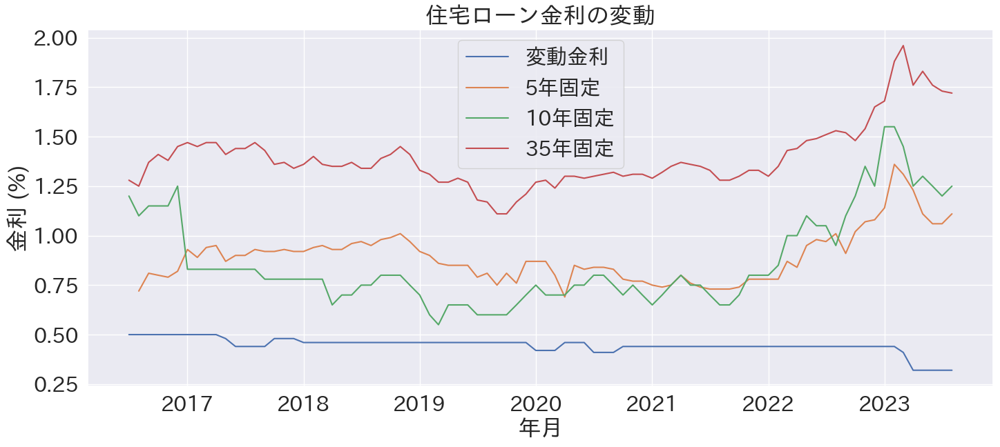

In [7]:
# グラフを再描画
pyplot.figure(figsize=(15, 7))
for column in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    pyplot.plot(_df['年月'], _df[column], label=column)

pyplot.title("住宅ローン金利の変動")
pyplot.xlabel("年月")
pyplot.ylabel("金利 (%)")
pyplot.legend()
pyplot.grid(True)
pyplot.tight_layout()
pyplot.show()


In [8]:
import optuna

from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics


In [9]:
def build_prophet_model(is_longterm=True, **params) -> Prophet:
   print(f"build_prophet_model: {is_longterm=} {params}")
   model = Prophet(**params, yearly_seasonality=4)
   model.add_seasonality(name='triennial', period=365.25*3, fourier_order=1)
   model.add_seasonality(name='kitchen', period=365.25/12*40, fourier_order=1)
   if is_longterm:
      model.add_seasonality(name='quinquennial', period=365.25*5, fourier_order=1)
      model.add_seasonality(name='decennial_09', period=365.25*9, fourier_order=1)
      model.add_seasonality(name='decennial_10', period=365.25*10, fourier_order=1)
   return model


In [10]:
class Evaluator(object):
   def __init__(self, df: pandas.DataFrame, n_horizon: int=31*12, freq="3MS") -> None:
      self.df: pandas.DataFrame = df
      self.n_horizon: int = n_horizon  # cv prediction range
      self.freq = freq     # cutoff freq

   def objective_value(self, trial: optuna.Trial) -> float:
      params = {
               "growth" : 
                  trial.suggest_categorical("growth", ["linear", "logistic", "flat"]),
               "changepoint_range" : 
                  trial.suggest_float("changepoint_range", 0.8, 1.0),
               "changepoint_prior_scale" : 
                  trial.suggest_float("changepoint_prior_scale", 0.001, 5),
               "seasonality_prior_scale" : 
                  trial.suggest_float("seasonality_prior_scale", 0.01, 10),
               "seasonality_mode" : 
                  trial.suggest_categorical("seasonality_mode", ["additive", "multiplicative"])
               }

      model: Prophet = build_prophet_model(**params)
      model.fit(self.df)
      __df_cv, df_pm = self.run_cross_validation(model=model, horizon_scaler=3)
      n = df_pm.shape[0]
      # NOTE: 
      #     - rmse: horizon が長くなる(index が後になる)とエラー幅が増加するので、
      #             差に敏感な rmse の後半を多めに評価するように逆順で累積する
      #     - mae : rmse と同じく、horizon が短い間も精度が高くないと困るので、
      #             前半を多めに評価するように mae を累積する
      score = numpy.cumsum(df_pm['rmse'].values[::-1]).mean() + numpy.cumsum(df_pm['mae'].values).mean()
      score /= n     # for intepretability of `score` in optuna.visualizaion

      return score

   def run_cross_validation(self, model: Prophet, horizon_scaler: int=2) -> tuple[pandas.DataFrame, pandas.DataFrame]:
      n_horizon = self.n_horizon
      date_start = self.df.ds.max() - pandas.Timedelta(days=n_horizon * horizon_scaler)
      date_end = self.df.ds.max() - pandas.Timedelta(days=n_horizon)
      cutoffs = pandas.date_range(start=date_start, end=date_end, freq=self.freq)

      # run cv and metrics
      df_cv = cross_validation(model, cutoffs=cutoffs, horizon=f"{n_horizon} days", parallel="processes")
      df_pm = performance_metrics(df_cv)

      # store context
      self.date_start = date_start
      self.date_end = date_end
      self.cutoffs = cutoffs

      return df_cv, df_pm


In [11]:
from dataclasses import dataclass


In [12]:
@dataclass
class Limitter(object):
    df: pandas.DataFrame

    def __post_init__(self):
        df = self.df
        self.floor = df.y.min() - 3 * df.y.std()
        self.cap = df.y.max() + 3 * df.y.std()


def setup_limit(df: pandas.DataFrame, lmt: Limitter, inplace=False) -> pandas.DataFrame:
    _df = df
    if not inplace:
        _df = df.copy()
    _df["floor"] = lmt.floor
    _df["cap"] = lmt.cap
    return _df


In [13]:
@dataclass
class BestEstimator(object):
    df: pandas.DataFrame
    model: Prophet
    evaluator: Evaluator
    study: optuna.Study
    df_cv: dict
    df_pm: dict


# Setup the Bests

In [14]:
n_years = 2
n_predicts = 12 * n_years

bests = {}
for rate_type in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    # setup
    df = _df.rename({"年月": "ds", rate_type: "y"}, axis=1)[["ds", "y"]]
    lmt = Limitter(df)
    df = setup_limit(df, lmt)
    evl = Evaluator(df=df, n_horizon=31*12)

    # optimize hyper params
    study: optuna.Study = optuna.create_study(direction="minimize")
    study.optimize(evl.objective_value, n_trials=100)

    # rerun cv
    model: Prophet = build_prophet_model(**study.best_params)
    model.fit(df)
    df_cv, df_pm = evl.run_cross_validation(model=model, horizon_scaler=3)

    # predict
    future = model.make_future_dataframe(periods=n_predicts, freq="MS")
    future = setup_limit(future, lmt)
    forecast = model.predict(future)

    # store estimator
    bst = BestEstimator(df=df, model=model, evaluator=evl, study=study, df_cv=df_cv, df_pm=df_pm)
    bests[rate_type] = bst


[I 2023-10-16 02:22:24,644] A new study created in memory with name: no-name-74867665-510d-4d7a-9c81-e1b9b7ef2d40
02:22:24 - cmdstanpy - INFO - Chain [1] start processing


build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8273752429541126, 'changepoint_prior_scale': 4.298089795716139, 'seasonality_prior_scale': 1.541225408339232, 'seasonality_mode': 'multiplicative'}


02:22:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing
02:22:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8333575151760247, 'changepoint_prior_scale': 0.9604073639477017, 'seasonality_prior_scale': 4.040487258383128, 'seasonality_mode': 'additive'}


02:22:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing
02:22:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8362379914846266, 'changepoint_prior_scale': 3.1414163223860294, 'seasonality_prior_scale': 7.778066391020975, 'seasonality_mode': 'multiplicative'}


02:22:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:27 - cmdstanpy - INFO - Chain [1] done processing
02:22:27 - cmdstanpy - INFO - Chain [1] done processing
02:22:27 - cmdstanpy - INFO - Chain [1] done processing
02:22:28 - cmdstanpy - INFO - Chain [1] done processing
02:22:28 - cmdstanpy - INFO - Chain [1] done processing
02:22:28 - cmdstanpy - INFO - Chain [1] done processing
02:22:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9812735152988736, 'changepoint_prior_scale': 0.5350012046624776, 'seasonality_prior_scale': 5.390056296069661, 'seasonality_mode': 'multiplicative'}


02:22:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing
02:22:30 - cmdstanpy - INFO - Chain [1] done processing
02:22:30 - cmdstanpy - INFO - Chain [1] done processing
02:22:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9262711440060272, 'changepoint_prior_scale': 3.4034797978338918, 'seasonality_prior_scale': 0.3788033541352886, 'seasonality_mode': 'multiplicative'}


02:22:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:31 - cmdstanpy - INFO - Chain [1] done processing
02:22:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9335335799893065, 'changepoint_prior_scale': 3.2344982669347764, 'seasonality_prior_scale': 6.6138499606007635, 'seasonality_mode': 'multiplicative'}


02:22:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing
02:22:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9427307311167006, 'changepoint_prior_scale': 2.487529332431438, 'seasonality_prior_scale': 8.360339501064376, 'seasonality_mode': 'multiplicative'}


02:22:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:41 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing
02:22:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8571844816501425, 'changepoint_prior_scale': 4.61127509386862, 'seasonality_prior_scale': 5.296519507734415, 'seasonality_mode': 'additive'}


02:22:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:44 - cmdstanpy - INFO - Chain [1] done processing
02:22:44 - cmdstanpy - INFO - Chain [1] done processing
02:22:44 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8031380289678138, 'changepoint_prior_scale': 4.455535865758065, 'seasonality_prior_scale': 1.4813004204188065, 'seasonality_mode': 'additive'}


02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:46,112] Trial 8 finished with value: 0.2256568209555562 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9949600929625707, 'changepoint_prior_scale': 2.902159597037435, 'seasonality_prior_scale': 4.0292996098060305, 'seasonality_mode': 'additive'}


02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:46,493] Trial 9 finished with value: 0.10664325366540252 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9895861417523018, 'changepoint_prior_scale': 2.0528888979423416, 'seasonality_prior_scale': 9.972898993995859, 'seasonality_mode': 'additive'}


02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:47,057] Trial 10 finished with value: 0.11900923131060905 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9988930882605508, 'changepoint_prior_scale': 1.4506180528827808, 'seasonality_prior_scale': 9.51647086510872, 'seasonality_mode': 'additive'}


02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:47,655] Trial 11 finished with value: 0.11875852131174912 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9929382510143527, 'changepoint_prior_scale': 1.5852411051018427, 'seasonality_prior_scale': 3.4452602976653797, 'seasonality_mode': 'additive'}


02:22:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9644865659783314, 'changepoint_prior_scale': 0.022547925975098693, 'seasonality_prior_scale': 3.5305532569690343, 'seasonality_mode': 'additive'}


02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:49,042] Trial 13 finished with value: 0.10313132537841696 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9581986433431584, 'changepoint_prior_scale': 0.5310702280943714, 'seasonality_prior_scale': 3.139128219065164, 'seasonality_mode': 'additive'}


02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
02:22:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:49,641] Trial 14 finished with value: 0.09964026176950043 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9005757055656731, 'changepoint_prior_scale': 1.4852831263872301, 'seasonality_prior_scale': 2.7598014340795194, 'seasonality_mode': 'additive'}


02:22:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8968652358078018, 'changepoint_prior_scale': 0.8512557689657569, 'seasonality_prior_scale': 2.429694964815181, 'seasonality_mode': 'additive'}


02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:50,842] Trial 16 finished with value: 0.0912617457059955 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8971993224253582, 'changepoint_prior_scale': 1.3910788709872892, 'seasonality_prior_scale': 2.4810714307056587, 'seasonality_mode': 'additive'}


02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:51,253] Trial 17 finished with value: 0.09196329666463753 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8875363431876333, 'changepoint_prior_scale': 1.0303113980848049, 'seasonality_prior_scale': 2.0582513081083498, 'seasonality_mode': 'additive'}


02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:51,728] Trial 18 finished with value: 0.0854602886805587 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8828036962354564, 'changepoint_prior_scale': 0.029456400911051395, 'seasonality_prior_scale': 0.1350271533452334, 'seasonality_mode': 'additive'}


02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:52,151] Trial 19 finished with value: 0.02292108554658222 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8759225208657796, 'changepoint_prior_scale': 0.1676619551056741, 'seasonality_prior_scale': 0.11670669534876568, 'seasonality_mode': 'additive'}


02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:52,524] Trial 20 finished with value: 0.02196730879711917 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8753416117535547, 'changepoint_prior_scale': 0.020066879054411846, 'seasonality_prior_scale': 0.7042336848499824, 'seasonality_mode': 'additive'}


02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing
02:22:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:53,808] Trial 21 finished with value: 0.04929266054467585 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8729593078409554, 'changepoint_prior_scale': 0.08514768242030848, 'seasonality_prior_scale': 0.11561535071061257, 'seasonality_mode': 'additive'}


02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:54,213] Trial 22 finished with value: 0.02190922199566735 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8715207682691325, 'changepoint_prior_scale': 0.05298145994997973, 'seasonality_prior_scale': 0.07424331818052111, 'seasonality_mode': 'additive'}


02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:54,817] Trial 23 finished with value: 0.019656431844833833 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.859035695324471, 'changepoint_prior_scale': 0.43560155787909094, 'seasonality_prior_scale': 1.1381458500624777, 'seasonality_mode': 'additive'}


02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:55,216] Trial 24 finished with value: 0.06480012148605963 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9125523605018386, 'changepoint_prior_scale': 0.35203576321180674, 'seasonality_prior_scale': 0.06168199388094045, 'seasonality_mode': 'additive'}


02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing
02:22:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:56,786] Trial 25 finished with value: 0.018996082568736444 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9232007774139638, 'changepoint_prior_scale': 0.5247902273632238, 'seasonality_prior_scale': 1.0093743235573647, 'seasonality_mode': 'additive'}


02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:57,200] Trial 26 finished with value: 0.06076093276816469 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9069723435352701, 'changepoint_prior_scale': 0.7558610150577338, 'seasonality_prior_scale': 0.07409046632283989, 'seasonality_mode': 'additive'}


02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:22:57,695] Trial 27 finished with value: 0.019648851325315398 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9071972164108637, 'changepoint_prior_scale': 0.7241760986031625, 'seasonality_prior_scale': 1.7609623878089646, 'seasonality_mode': 'additive'}


02:22:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] done processing
02:22:58 - cmdstanpy - INFO - Chain [1] done processing
02:22:58 - cmdstanpy - INFO - Chain [1] done processing
02:22:59 - cmdstanpy - INFO - Chain [1] done processing
02:22:59 - cmdstanpy - INFO - Chain [1] done processing
02:22:59 - cmdstanpy - INFO - Chain [1] done processing
02:22:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9139370961969864, 'changepoint_prior_scale': 1.0263004109402116, 'seasonality_prior_scale': 0.9548401348544258, 'seasonality_mode': 'multiplicative'}


02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing
02:23:01 - cmdstanpy - INFO - Chain [1] done processing
02:23:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:04,642] Trial 29 finished with value: 0.053296247797542974 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9102332235494982, 'changepoint_prior_scale': 0.29924792437787945, 'seasonality_prior_scale': 1.564927372259713, 'seasonality_mode': 'additive'}


02:23:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8667570747258395, 'changepoint_prior_scale': 0.3914526919709506, 'seasonality_prior_scale': 0.030558890880496112, 'seasonality_mode': 'additive'}


02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:06,691] Trial 31 finished with value: 0.017997401146139402 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8611439628143361, 'changepoint_prior_scale': 0.7189178780434446, 'seasonality_prior_scale': 0.6045872294014343, 'seasonality_mode': 'additive'}


02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:07,103] Trial 32 finished with value: 0.04524381387946855 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8921378455935995, 'changepoint_prior_scale': 0.3302348712202803, 'seasonality_prior_scale': 0.030924436685785928, 'seasonality_mode': 'additive'}


02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:07,465] Trial 33 finished with value: 0.01799753246077285 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8892719740300635, 'changepoint_prior_scale': 1.087446826201345, 'seasonality_prior_scale': 1.2393562477040245, 'seasonality_mode': 'additive'}


02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:07,893] Trial 34 finished with value: 0.06783357558306609 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9122382520124686, 'changepoint_prior_scale': 0.4721849024309465, 'seasonality_prior_scale': 1.9326940947149325, 'seasonality_mode': 'multiplicative'}


02:23:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.895017415523691, 'changepoint_prior_scale': 0.3240300044181026, 'seasonality_prior_scale': 0.6444286420105138, 'seasonality_mode': 'additive'}


02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:10,032] Trial 36 finished with value: 0.046897278321481106 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8459400919180842, 'changepoint_prior_scale': 0.781935289758692, 'seasonality_prior_scale': 0.7380952557180182, 'seasonality_mode': 'multiplicative'}


02:23:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done processing
02:23:11 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9218288877737083, 'changepoint_prior_scale': 0.3502719016141145, 'seasonality_prior_scale': 1.252571658742169, 'seasonality_mode': 'additive'}


02:23:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing
02:23:12 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9303554716326545, 'changepoint_prior_scale': 1.128741169711079, 'seasonality_prior_scale': 0.5229818376673456, 'seasonality_mode': 'multiplicative'}


02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:13,492] Trial 39 finished with value: 0.03900518347689185 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9442011218219444, 'changepoint_prior_scale': 0.6090081826548768, 'seasonality_prior_scale': 1.9186441993412204, 'seasonality_mode': 'additive'}


02:23:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] done processing
02:23:14 - cmdstanpy - INFO - Chain [1] done processing
02:23:14 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8828490852397632, 'changepoint_prior_scale': 0.2836396905449656, 'seasonality_prior_scale': 0.05718592431478249, 'seasonality_mode': 'additive'}


02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:16,754] Trial 41 finished with value: 0.018796246734866785 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8835579674343487, 'changepoint_prior_scale': 0.3287479424400702, 'seasonality_prior_scale': 0.4504878495802893, 'seasonality_mode': 'additive'}


02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:17,260] Trial 42 finished with value: 0.0386163824300899 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8998482124593339, 'changepoint_prior_scale': 0.8961847321779324, 'seasonality_prior_scale': 0.04210068997590181, 'seasonality_mode': 'additive'}


02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:17,742] Trial 43 finished with value: 0.018220877003023838 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8925492320833102, 'changepoint_prior_scale': 0.29755466602432745, 'seasonality_prior_scale': 1.417582629283754, 'seasonality_mode': 'additive'}


02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:18,304] Trial 44 finished with value: 0.072582640425225 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8638199663959047, 'changepoint_prior_scale': 1.2416512736101344, 'seasonality_prior_scale': 0.8404442104566444, 'seasonality_mode': 'additive'}


02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:18,961] Trial 45 finished with value: 0.0546143631074412 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8494419670459369, 'changepoint_prior_scale': 0.9194699012409377, 'seasonality_prior_scale': 0.013363720369946687, 'seasonality_mode': 'additive'}


02:23:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing
02:23:19 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8820155395188402, 'changepoint_prior_scale': 0.5466757904075248, 'seasonality_prior_scale': 1.1342490710261082, 'seasonality_mode': 'multiplicative'}


02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing
02:23:22 - cmdstanpy - INFO - Chain [1] done processing
02:23:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:27,371] Trial 47 finished with value: 0.058943803952652814 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9028174038519756, 'changepoint_prior_scale': 1.6902034825561003, 'seasonality_prior_scale': 0.4597473783830346, 'seasonality_mode': 'additive'}


02:23:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9173844731311808, 'changepoint_prior_scale': 0.8897884948171673, 'seasonality_prior_scale': 1.3773168689729938, 'seasonality_mode': 'additive'}


02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:29 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:30,186] Trial 49 finished with value: 0.07159194734173531 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9010130469565848, 'changepoint_prior_scale': 0.6206055131577655, 'seasonality_prior_scale': 2.2927848633260894, 'seasonality_mode': 'additive'}


02:23:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing
02:23:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.906621984813582, 'changepoint_prior_scale': 0.7464068299506093, 'seasonality_prior_scale': 0.3835631073492585, 'seasonality_mode': 'additive'}


02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:31,385] Trial 51 finished with value: 0.035553209449754646 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.893491524063616, 'changepoint_prior_scale': 0.23281487565656223, 'seasonality_prior_scale': 0.09214689358970593, 'seasonality_mode': 'additive'}


02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:31,826] Trial 52 finished with value: 0.02064425296506277 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9046423215235636, 'changepoint_prior_scale': 0.881350744994315, 'seasonality_prior_scale': 0.9547659972386235, 'seasonality_mode': 'additive'}


02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:32,389] Trial 53 finished with value: 0.05873061860097476 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9186514598623793, 'changepoint_prior_scale': 1.2751478321031733, 'seasonality_prior_scale': 1.686838366298041, 'seasonality_mode': 'additive'}


02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:33,092] Trial 54 finished with value: 0.0786471678281538 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8877318420818301, 'changepoint_prior_scale': 0.2144257958827968, 'seasonality_prior_scale': 0.3819621825296987, 'seasonality_mode': 'additive'}


02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:33,484] Trial 55 finished with value: 0.03548189181171323 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8796889891723643, 'changepoint_prior_scale': 0.4856309131712202, 'seasonality_prior_scale': 0.01015002007365252, 'seasonality_mode': 'additive'}


02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:33,893] Trial 56 finished with value: 0.019048351044515504 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8690814642501541, 'changepoint_prior_scale': 0.44854782597192855, 'seasonality_prior_scale': 4.716759352311299, 'seasonality_mode': 'additive'}


02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:34,300] Trial 57 finished with value: 0.11022063423553198 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8789497940637246, 'changepoint_prior_scale': 0.005549145359533103, 'seasonality_prior_scale': 0.7002416109516257, 'seasonality_mode': 'additive'}


02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:35,018] Trial 58 finished with value: 0.04913381294193118 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8652597812910491, 'changepoint_prior_scale': 0.193351302689421, 'seasonality_prior_scale': 1.5736608373909933, 'seasonality_mode': 'additive'}


02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
02:23:35 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:35,437] Trial 59 finished with value: 0.07647915442386728 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8766792767026942, 'changepoint_prior_scale': 0.5793482426943816, 'seasonality_prior_scale': 0.33245126489439675, 'seasonality_mode': 'additive'}


02:23:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8989056780194251, 'changepoint_prior_scale': 0.7312768175512062, 'seasonality_prior_scale': 0.014751911866, 'seasonality_mode': 'additive'}


02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:36,809] Trial 61 finished with value: 0.018467267922576556 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8886223844318002, 'changepoint_prior_scale': 0.4525034387268516, 'seasonality_prior_scale': 0.024399735237789332, 'seasonality_mode': 'additive'}


02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:37,463] Trial 62 finished with value: 0.01798199668889503 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8868168149284157, 'changepoint_prior_scale': 0.22238491201372784, 'seasonality_prior_scale': 0.7590803324005598, 'seasonality_mode': 'additive'}


02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:37,936] Trial 63 finished with value: 0.051454721526762136 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8983647417755092, 'changepoint_prior_scale': 0.6895448478791935, 'seasonality_prior_scale': 0.36506340863340403, 'seasonality_mode': 'additive'}


02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:38,432] Trial 64 finished with value: 0.03467700274115105 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8928637006234434, 'changepoint_prior_scale': 0.4120615141993277, 'seasonality_prior_scale': 1.1265822208594218, 'seasonality_mode': 'additive'}


02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:38,827] Trial 65 finished with value: 0.06444466463268796 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8720408681639455, 'changepoint_prior_scale': 1.0012669211033558, 'seasonality_prior_scale': 0.7013272420654147, 'seasonality_mode': 'additive'}


02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:39,287] Trial 66 finished with value: 0.049167599258689465 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9126044908225884, 'changepoint_prior_scale': 0.09323870419735558, 'seasonality_prior_scale': 0.3395310628618609, 'seasonality_mode': 'multiplicative'}


02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:39,753] Trial 67 finished with value: 0.03341713262911362 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8848011888849118, 'changepoint_prior_scale': 0.8307049831218417, 'seasonality_prior_scale': 1.0535803653615203, 'seasonality_mode': 'additive'}


02:23:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done processing
02:23:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9029939873792976, 'changepoint_prior_scale': 0.5909486432701826, 'seasonality_prior_scale': 0.8638943083393209, 'seasonality_mode': 'additive'}


02:23:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing
02:23:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.868280026454706, 'changepoint_prior_scale': 0.39385540434692723, 'seasonality_prior_scale': 0.27455980414327835, 'seasonality_mode': 'additive'}


02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:43,367] Trial 70 finished with value: 0.03024689811671641 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8808134511924562, 'changepoint_prior_scale': 0.42082431627676, 'seasonality_prior_scale': 0.014906170196687909, 'seasonality_mode': 'additive'}


02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:43,779] Trial 71 finished with value: 0.01845062577024767 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8982738792859226, 'changepoint_prior_scale': 0.14169904211566098, 'seasonality_prior_scale': 0.011472332804559757, 'seasonality_mode': 'additive'}


02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing
02:23:44 - cmdstanpy - INFO - Chain [1] done processing
02:23:44 - cmdstanpy - INFO - Chain [1] done processing
02:23:44 - cmdstanpy - INFO - Chain [1] done processing
02:23:44 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:45,729] Trial 72 finished with value: 0.019547147897385344 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8924073520627858, 'changepoint_prior_scale': 0.6654032104542063, 'seasonality_prior_scale': 0.5688028030855486, 'seasonality_mode': 'additive'}


02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:46,390] Trial 73 finished with value: 0.04375231138337841 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8756766332182689, 'changepoint_prior_scale': 0.45274254600776187, 'seasonality_prior_scale': 0.3051090387565619, 'seasonality_mode': 'additive'}


02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
02:23:46 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:46,986] Trial 74 finished with value: 0.03179550966573299 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8884692643946249, 'changepoint_prior_scale': 0.29506113948592094, 'seasonality_prior_scale': 1.3493145524398789, 'seasonality_mode': 'additive'}


02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:47,519] Trial 75 finished with value: 0.07083626904443051 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8810855354936914, 'changepoint_prior_scale': 0.14246936411065086, 'seasonality_prior_scale': 0.01201531980728147, 'seasonality_mode': 'additive'}


02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:48,281] Trial 76 finished with value: 0.01882777425207029 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8832378877010422, 'changepoint_prior_scale': 0.0814364530300107, 'seasonality_prior_scale': 0.8753928338914321, 'seasonality_mode': 'additive'}


02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:48,696] Trial 77 finished with value: 0.055936990461901696 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8564773304157404, 'changepoint_prior_scale': 0.841239287130567, 'seasonality_prior_scale': 0.4765735873960651, 'seasonality_mode': 'multiplicative'}


02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:49,140] Trial 78 finished with value: 0.03709752060773295 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8785179355979196, 'changepoint_prior_scale': 0.5367075868342521, 'seasonality_prior_scale': 0.2666330677805179, 'seasonality_mode': 'additive'}


02:23:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done processing
02:23:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8709384554879118, 'changepoint_prior_scale': 0.14204888170708763, 'seasonality_prior_scale': 0.6546418212205283, 'seasonality_mode': 'additive'}


02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:50,508] Trial 80 finished with value: 0.047310366804236996 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8972674015937977, 'changepoint_prior_scale': 0.31524010366889765, 'seasonality_prior_scale': 0.06257384109596184, 'seasonality_mode': 'additive'}


02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:51,578] Trial 81 finished with value: 0.019033775078028222 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.909245038874027, 'changepoint_prior_scale': 0.3880516589758351, 'seasonality_prior_scale': 0.9810542262718761, 'seasonality_mode': 'additive'}


02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:23:51,987] Trial 82 finished with value: 0.05971375519418773 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8903914044349853, 'changepoint_prior_scale': 0.008895874453091757, 'seasonality_prior_scale': 0.2261383215820079, 'seasonality_mode': 'additive'}


02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:00,714] Trial 83 finished with value: 0.02764662279198808 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8829857055320627, 'changepoint_prior_scale': 0.6464148760248349, 'seasonality_prior_scale': 0.5896128477615876, 'seasonality_mode': 'additive'}


02:24:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:01 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9006555871707134, 'changepoint_prior_scale': 0.7346676721751858, 'seasonality_prior_scale': 0.02799480346589171, 'seasonality_mode': 'additive'}


02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:03,004] Trial 85 finished with value: 0.017975865425743167 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9007355295381756, 'changepoint_prior_scale': 0.9429926164657205, 'seasonality_prior_scale': 1.1749939197160946, 'seasonality_mode': 'additive'}


02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:03,403] Trial 86 finished with value: 0.06592554762842519 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8962040750124526, 'changepoint_prior_scale': 0.7800031975917117, 'seasonality_prior_scale': 0.015954136061880002, 'seasonality_mode': 'additive'}


02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:03,804] Trial 87 finished with value: 0.018373543367892597 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9059572620315823, 'changepoint_prior_scale': 1.0703963007894948, 'seasonality_prior_scale': 0.5418476025520933, 'seasonality_mode': 'additive'}


02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
02:24:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:04,534] Trial 88 finished with value: 0.04261409078472536 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8966348816653368, 'changepoint_prior_scale': 0.7680673869925629, 'seasonality_prior_scale': 0.8184171166684251, 'seasonality_mode': 'additive'}


02:24:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8874234188562785, 'changepoint_prior_scale': 1.152748064403327, 'seasonality_prior_scale': 0.30065989885351174, 'seasonality_mode': 'multiplicative'}


02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:05,858] Trial 90 finished with value: 0.029801376147089168 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8943113431399708, 'changepoint_prior_scale': 0.5341330581716539, 'seasonality_prior_scale': 0.014960328753852581, 'seasonality_mode': 'additive'}


02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:06,261] Trial 91 finished with value: 0.018446732905210452 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8923197514476793, 'changepoint_prior_scale': 0.5248065221305312, 'seasonality_prior_scale': 0.2790725288107525, 'seasonality_mode': 'additive'}


02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
02:24:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:06,825] Trial 92 finished with value: 0.03047293030466325 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9016314473162077, 'changepoint_prior_scale': 0.726289400314224, 'seasonality_prior_scale': 0.524112873317176, 'seasonality_mode': 'additive'}


02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:07,174] Trial 93 finished with value: 0.041871043401774645 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8964155041646782, 'changepoint_prior_scale': 0.8732172627212722, 'seasonality_prior_scale': 0.21751854486463595, 'seasonality_mode': 'additive'}


02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:07,869] Trial 94 finished with value: 0.027309112440152453 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8875547405473151, 'changepoint_prior_scale': 0.6396416485396801, 'seasonality_prior_scale': 0.8997667218196591, 'seasonality_mode': 'additive'}


02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:08,400] Trial 95 finished with value: 0.056862188248583655 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8761802358844758, 'changepoint_prior_scale': 0.46958317990259374, 'seasonality_prior_scale': 0.017124651391361382, 'seasonality_mode': 'additive'}


02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:08,958] Trial 96 finished with value: 0.018304045647455223 and parameters: {

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8766216849919264, 'changepoint_prior_scale': 0.48536084274419383, 'seasonality_prior_scale': 1.4336493222743094, 'seasonality_mode': 'additive'}


02:24:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing
02:24:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9070972820993597, 'changepoint_prior_scale': 1.0033341681692625, 'seasonality_prior_scale': 0.5123595169080233, 'seasonality_mode': 'additive'}


02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:10,490] Trial 98 finished with value: 0.04133908164240604 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8741648563047775, 'changepoint_prior_scale': 0.6550382439233078, 'seasonality_prior_scale': 0.213159745275867, 'seasonality_mode': 'additive'}


02:24:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing
02:24:11 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9006555871707134, 'changepoint_prior_scale': 0.7346676721751858, 'seasonality_prior_scale': 0.02799480346589171, 'seasonality_mode': 'additive'}


02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:12,494] A new study created in memory with name: no-name-97b20f55-8827-42bd-

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9298974531067797, 'changepoint_prior_scale': 2.803410527030893, 'seasonality_prior_scale': 8.269554019241985, 'seasonality_mode': 'multiplicative'}


02:24:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8910617130501096, 'changepoint_prior_scale': 3.1717273626746247, 'seasonality_prior_scale': 1.768863092080628, 'seasonality_mode': 'additive'}


02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:17,995] Trial 1 finished with value: 0.3982366542364764 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8148680482595392, 'changepoint_prior_scale': 0.7174991274699906, 'seasonality_prior_scale': 9.547018840352884, 'seasonality_mode': 'multiplicative'}


02:24:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing
02:24:19 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9533609952567139, 'changepoint_prior_scale': 3.6393450089541584, 'seasonality_prior_scale': 3.212977702451034, 'seasonality_mode': 'additive'}


02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
02:24:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:20,590] Trial 3 finished with value: 0.3764062548357325 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8307372621157885, 'changepoint_prior_scale': 2.485060456708791, 'seasonality_prior_scale': 3.579480842950355, 'seasonality_mode': 'additive'}


02:24:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:22 - cmdstanpy - INFO - Chain [1] done processing
02:24:22 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] done processing
02:24:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9163335165215188, 'changepoint_prior_scale': 2.271823307323923, 'seasonality_prior_scale': 1.8695133343322057, 'seasonality_mode': 'multiplicative'}


02:24:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:25 - cmdstanpy - INFO - Chain [1] done processing
02:24:25 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] done processing
02:24:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9118061059421952, 'changepoint_prior_scale': 3.5850558814153692, 'seasonality_prior_scale': 9.46191456260467, 'seasonality_mode': 'multiplicative'}


02:24:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:30 - cmdstanpy - INFO - Chain [1] done processing
02:24:30 - cmdstanpy - INFO - Chain [1] done processing
02:24:30 - cmdstanpy - INFO - Chain [1] done processing
02:24:31 - cmdstanpy - INFO - Chain [1] done processing
02:24:31 - cmdstanpy - INFO - Chain [1] done processing
02:24:31 - cmdstanpy - INFO - Chain [1] done processing
02:24:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.869377257071724, 'changepoint_prior_scale': 2.563742808519575, 'seasonality_prior_scale': 6.919436956882481, 'seasonality_mode': 'multiplicative'}


02:24:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing
02:24:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8835041085545478, 'changepoint_prior_scale': 4.959888563226253, 'seasonality_prior_scale': 2.572695821238844, 'seasonality_mode': 'additive'}


02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:33,682] Trial 8 finished with value: 0.4590280713511175 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.986599884569743, 'changepoint_prior_scale': 4.63334330453336, 'seasonality_prior_scale': 0.7272571268838502, 'seasonality_mode': 'multiplicative'}


02:24:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing
02:24:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8050112662956516, 'changepoint_prior_scale': 1.4289811738605167, 'seasonality_prior_scale': 4.6512846960497285, 'seasonality_mode': 'additive'}


02:24:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing
02:24:39 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8001217850528644, 'changepoint_prior_scale': 1.4140360443735094, 'seasonality_prior_scale': 4.807540945146062, 'seasonality_mode': 'additive'}


02:24:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:41 - cmdstanpy - INFO - Chain [1] done processing
02:24:41 - cmdstanpy - INFO - Chain [1] done processing
02:24:41 - cmdstanpy - INFO - Chain [1] done processing
02:24:41 - cmdstanpy - INFO - Chain [1] done processing
02:24:42 - cmdstanpy - INFO - Chain [1] done processing
02:24:42 - cmdstanpy - INFO - Chain [1] done processing
02:24:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8374384043793099, 'changepoint_prior_scale': 0.010076202339757145, 'seasonality_prior_scale': 4.746723804492868, 'seasonality_mode': 'additive'}


02:24:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing
02:24:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8443640852435551, 'changepoint_prior_scale': 2.144655437876481, 'seasonality_prior_scale': 5.864928403370275, 'seasonality_mode': 'additive'}


02:24:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:48 - cmdstanpy - INFO - Chain [1] done processing
02:24:48 - cmdstanpy - INFO - Chain [1] done processing
02:24:48 - cmdstanpy - INFO - Chain [1] done processing
02:24:48 - cmdstanpy - INFO - Chain [1] done processing
02:24:49 - cmdstanpy - INFO - Chain [1] done processing
02:24:49 - cmdstanpy - INFO - Chain [1] done processing
02:24:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8018784946671387, 'changepoint_prior_scale': 1.518530962137768, 'seasonality_prior_scale': 3.6889258000761886, 'seasonality_mode': 'additive'}


02:24:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing
02:24:51 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8043047887893329, 'changepoint_prior_scale': 1.4900777014102626, 'seasonality_prior_scale': 5.954286312188447, 'seasonality_mode': 'additive'}


02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:52 - cmdstanpy - INFO - Chain [1] start processing
02:24:52 - cmdstanpy - INFO - Chain [1] start processing
02:24:52 - cmdstanpy - INFO - Chain [1] start processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:52,213] Trial 15 finished with value: 0.619385718691504 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8577009403023147, 'changepoint_prior_scale': 1.5987625848162246, 'seasonality_prior_scale': 3.9482069622598015, 'seasonality_mode': 'additive'}


02:24:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing
02:24:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8547962220107099, 'changepoint_prior_scale': 1.8638799057064142, 'seasonality_prior_scale': 0.1438839711348514, 'seasonality_mode': 'additive'}


02:24:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:56 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8582847915976163, 'changepoint_prior_scale': 0.6288581969178282, 'seasonality_prior_scale': 0.5551278132627546, 'seasonality_mode': 'additive'}


02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:57,680] Trial 18 finished with value: 0.27416362046869686 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8657926366407157, 'changepoint_prior_scale': 0.7068071761978785, 'seasonality_prior_scale': 0.1222835723539818, 'seasonality_mode': 'additive'}


02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:58,155] Trial 19 finished with value: 0.16308679505357673 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8804266161606104, 'changepoint_prior_scale': 0.7435735738107728, 'seasonality_prior_scale': 0.028545589588426346, 'seasonality_mode': 'additive'}


02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:58,582] Trial 20 finished with value: 0.14362900773591925 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8771419642972467, 'changepoint_prior_scale': 0.8226341420483978, 'seasonality_prior_scale': 0.0375230862915214, 'seasonality_mode': 'additive'}


02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:24:59,140] Trial 21 finished with value: 0.1555658273000273 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8838399592966958, 'changepoint_prior_scale': 0.9965008236122522, 'seasonality_prior_scale': 0.14347997991372669, 'seasonality_mode': 'additive'}


02:24:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8982675978014407, 'changepoint_prior_scale': 0.008125369335810317, 'seasonality_prior_scale': 1.1920622927107654, 'seasonality_mode': 'additive'}


02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:00,312] Trial 23 finished with value: 0.3413252733598065 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8773008748813556, 'changepoint_prior_scale': 2.015363378511646, 'seasonality_prior_scale': 1.2250874652796817, 'seasonality_mode': 'additive'}


02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
02:25:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:00,850] Trial 24 finished with value: 0.3445410511663011 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8519205068145903, 'changepoint_prior_scale': 1.0705113711108192, 'seasonality_prior_scale': 0.010038779056426445, 'seasonality_mode': 'additive'}


02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:01,492] Trial 25 finished with value: 0.15276507580384444 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.845180893107032, 'changepoint_prior_scale': 1.0683576703517728, 'seasonality_prior_scale': 2.1869661894424177, 'seasonality_mode': 'additive'}


02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:01,964] Trial 26 finished with value: 0.43158579796839475 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8545043377645516, 'changepoint_prior_scale': 1.8496732490148449, 'seasonality_prior_scale': 0.985561704538873, 'seasonality_mode': 'additive'}


02:25:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing
02:25:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8267510989458438, 'changepoint_prior_scale': 0.41237150222803726, 'seasonality_prior_scale': 2.608753879907751, 'seasonality_mode': 'additive'}


02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:03 - cmdstanpy - INFO - Chain [1] done processing
02:25:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:10,483] Trial 28 finished with value: 0.4616559954097809 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9007105664970375, 'changepoint_prior_scale': 1.177736228463502, 'seasonality_prior_scale': 1.3938770019322542, 'seasonality_mode': 'multiplicative'}


02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] done processing
02:25:10 - cmdstanpy - INFO - Chain [1] done processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing
02:25:12 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:13,056] Trial 29 finished with value: 0.8298679467141407 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8255541142188668, 'changepoint_prior_scale': 1.8540841531576548, 'seasonality_prior_scale': 0.5867938618239087, 'seasonality_mode': 'additive'}


02:25:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing
02:25:13 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8713487340464107, 'changepoint_prior_scale': 1.0227525423059236, 'seasonality_prior_scale': 0.5390227369854734, 'seasonality_mode': 'additive'}


02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:14,442] Trial 31 finished with value: 0.27235265033461054 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.848297099374004, 'changepoint_prior_scale': 1.2098173209297158, 'seasonality_prior_scale': 0.05953812837858607, 'seasonality_mode': 'additive'}


02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:14,828] Trial 32 finished with value: 0.14143069729262467 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8449511647819572, 'changepoint_prior_scale': 0.428825243211057, 'seasonality_prior_scale': 1.5203099180540467, 'seasonality_mode': 'additive'}


02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:15,288] Trial 33 finished with value: 0.3748219093133167 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8540249652963147, 'changepoint_prior_scale': 1.2271215733727034, 'seasonality_prior_scale': 0.061875365185850795, 'seasonality_mode': 'additive'}


02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:15,951] Trial 34 finished with value: 0.14190714038953953 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8638424700971147, 'changepoint_prior_scale': 1.8088790208936552, 'seasonality_prior_scale': 1.9382644348356692, 'seasonality_mode': 'additive'}


02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:16,447] Trial 35 finished with value: 0.41298378584838336 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.819055657051177, 'changepoint_prior_scale': 1.3470435902534776, 'seasonality_prior_scale': 0.9209717849903115, 'seasonality_mode': 'multiplicative'}


02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:17,757] Trial 36 finished with value: 0.6415504449241992 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8343755505188245, 'changepoint_prior_scale': 2.297364205903591, 'seasonality_prior_scale': 1.2482053836406541, 'seasonality_mode': 'additive'}


02:25:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8927202720678248, 'changepoint_prior_scale': 1.7326133173961058, 'seasonality_prior_scale': 1.864577362633943, 'seasonality_mode': 'additive'}


02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing
02:25:19 - cmdstanpy - INFO - Chain [1] done processing
02:25:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:19,121] Trial 38 finished with value: 0.4066900049347984 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8695480607738565, 'changepoint_prior_scale': 1.2635487421103084, 'seasonality_prior_scale': 2.515095725233299, 'seasonality_mode': 'multiplicative'}


02:25:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done processing
02:25:20 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8505848506191177, 'changepoint_prior_scale': 2.7667736009140502, 'seasonality_prior_scale': 0.6614585900799771, 'seasonality_mode': 'additive'}


02:25:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8547808860591817, 'changepoint_prior_scale': 1.1383491473858935, 'seasonality_prior_scale': 0.03641958232269845, 'seasonality_mode': 'additive'}


02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:24,290] Trial 41 finished with value: 0.1412064249024208 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8380679400653077, 'changepoint_prior_scale': 1.2646694042917934, 'seasonality_prior_scale': 0.42376636080692154, 'seasonality_mode': 'additive'}


02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:24,703] Trial 42 finished with value: 0.25587961473369286 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8599007758916397, 'changepoint_prior_scale': 0.9036618150629717, 'seasonality_prior_scale': 0.9875862099604285, 'seasonality_mode': 'additive'}


02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:25,283] Trial 43 finished with value: 0.31961487447477727 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8829803060813743, 'changepoint_prior_scale': 1.5866565844751837, 'seasonality_prior_scale': 1.5581881506403965, 'seasonality_mode': 'additive'}


02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
02:25:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:25,836] Trial 44 finished with value: 0.37827764006738307 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8396190117291059, 'changepoint_prior_scale': 1.2322583946652446, 'seasonality_prior_scale': 0.3736811929838795, 'seasonality_mode': 'multiplicative'}


02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:26,688] Trial 45 finished with value: 0.19414939473746842 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8307011222791756, 'changepoint_prior_scale': 2.0504489567804938, 'seasonality_prior_scale': 0.7023503982723905, 'seasonality_mode': 'additive'}


02:25:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:28 - cmdstanpy - INFO - Chain [1] done processing
02:25:28 - cmdstanpy - INFO - Chain [1] done processing
02:25:28 - cmdstanpy - INFO - Chain [1] done processing
02:25:28 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8477113428524177, 'changepoint_prior_scale': 0.7544027025816451, 'seasonality_prior_scale': 0.02547596486907544, 'seasonality_mode': 'additive'}


02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:29,889] Trial 47 finished with value: 0.1449644435435963 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8591474920576787, 'changepoint_prior_scale': 1.6003004493433253, 'seasonality_prior_scale': 0.9139397430660673, 'seasonality_mode': 'additive'}


02:25:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing
02:25:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8174226917544458, 'changepoint_prior_scale': 0.5133381397718015, 'seasonality_prior_scale': 1.4282582758246676, 'seasonality_mode': 'additive'}


02:25:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] start processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing
02:25:34 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8684446033785386, 'changepoint_prior_scale': 0.2573942043857754, 'seasonality_prior_scale': 0.4402215199236963, 'seasonality_mode': 'multiplicative'}


02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:35 - cmdstanpy - INFO - Chain [1] done processing
02:25:35 - cmdstanpy - INFO - Chain [1] done processing
02:25:35 - cmdstanpy - INFO - Chain [1] done processing
02:25:35 - cmdstanpy - INFO - Chain [1] done processing
02:25:35 - cmdstanpy - INFO - Chain [1] done processing
02:25:36 - cmdstanpy - INFO - Chain [1] done processing
02:25:36 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:37,241] Trial 50 finished with value: 0.20867119148837246 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8539625782218363, 'changepoint_prior_scale': 0.7848324875735151, 'seasonality_prior_scale': 0.057735710871230486, 'seasonality_mode': 'additive'}


02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:37,668] Trial 51 finished with value: 0.1411227044485032 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8525493813297949, 'changepoint_prior_scale': 0.8608336862371673, 'seasonality_prior_scale': 0.33010145606904856, 'seasonality_mode': 'additive'}


02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:38,146] Trial 52 finished with value: 0.2358872414185045 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8618629161990922, 'changepoint_prior_scale': 0.6359524736975949, 'seasonality_prior_scale': 0.9515916389562251, 'seasonality_mode': 'additive'}


02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:38,564] Trial 53 finished with value: 0.3157894240418822 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8437965501370456, 'changepoint_prior_scale': 1.3516830764546337, 'seasonality_prior_scale': 0.33917732121644517, 'seasonality_mode': 'additive'}


02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:38,984] Trial 54 finished with value: 0.23796348479686466 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8766026587651408, 'changepoint_prior_scale': 1.0888379341269676, 'seasonality_prior_scale': 0.08463157997324873, 'seasonality_mode': 'additive'}


02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:39,564] Trial 55 finished with value: 0.14864892845568062 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8370570046857676, 'changepoint_prior_scale': 0.8897266576674315, 'seasonality_prior_scale': 0.8304589181931953, 'seasonality_mode': 'additive'}


02:25:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:40 - cmdstanpy - INFO - Chain [1] done processing
02:25:40 - cmdstanpy - INFO - Chain [1] done processing
02:25:40 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8534873902925975, 'changepoint_prior_scale': 1.4472582050836238, 'seasonality_prior_scale': 1.6890284699177038, 'seasonality_mode': 'additive'}


02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:42,044] Trial 57 finished with value: 0.39089998873209186 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8624514262747083, 'changepoint_prior_scale': 0.797369856302506, 'seasonality_prior_scale': 0.02496433144857396, 'seasonality_mode': 'additive'}


02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:42,639] Trial 58 finished with value: 0.14521783666560786 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8716979840972974, 'changepoint_prior_scale': 0.6099171402147185, 'seasonality_prior_scale': 1.1129679686460325, 'seasonality_mode': 'additive'}


02:25:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done processing
02:25:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8425081243707083, 'changepoint_prior_scale': 1.1393829906111586, 'seasonality_prior_scale': 0.6271072579205158, 'seasonality_mode': 'additive'}


02:25:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8512229668086714, 'changepoint_prior_scale': 0.7617793811053094, 'seasonality_prior_scale': 0.2967672665576111, 'seasonality_mode': 'additive'}


02:25:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing
02:25:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8466104439025685, 'changepoint_prior_scale': 0.9641251558199331, 'seasonality_prior_scale': 0.01519489414719332, 'seasonality_mode': 'additive'}


02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
02:25:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:48,093] Trial 62 finished with value: 0.15097544554906514 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8314483779279926, 'changepoint_prior_scale': 0.23727865159219252, 'seasonality_prior_scale': 0.6974458642534836, 'seasonality_mode': 'additive'}


02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:48,472] Trial 63 finished with value: 0.2879755096316092 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8575053430339447, 'changepoint_prior_scale': 0.7258678799495519, 'seasonality_prior_scale': 1.2187143305769241, 'seasonality_mode': 'additive'}


02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:49,487] Trial 64 finished with value: 0.34395442672108995 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8669032549708994, 'changepoint_prior_scale': 1.1389819710791924, 'seasonality_prior_scale': 0.31305511047622453, 'seasonality_mode': 'additive'}


02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:49,851] Trial 65 finished with value: 0.2311037246037606 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.850967304391953, 'changepoint_prior_scale': 1.4268145715760285, 'seasonality_prior_scale': 0.013710745917814154, 'seasonality_mode': 'additive'}


02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:50,663] Trial 66 finished with value: 0.15172112663199092 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.847947311004398, 'changepoint_prior_scale': 0.5703857338720583, 'seasonality_prior_scale': 0.6675240537151146, 'seasonality_mode': 'additive'}


02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing
02:25:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:51,084] Trial 67 finished with value: 0.2853820160489547 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8251393751561064, 'changepoint_prior_scale': 0.9944867948040067, 'seasonality_prior_scale': 1.2786016302048993, 'seasonality_mode': 'multiplicative'}


02:25:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done processing
02:25:52 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8378737733212077, 'changepoint_prior_scale': 1.6872100962291712, 'seasonality_prior_scale': 0.3749275167092146, 'seasonality_mode': 'additive'}


02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:53,557] Trial 69 finished with value: 0.24601770793886266 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8562027701017667, 'changepoint_prior_scale': 1.3119785119995018, 'seasonality_prior_scale': 0.9410960151870791, 'seasonality_mode': 'additive'}


02:25:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:54 - cmdstanpy - INFO - Chain [1] start processing
02:25:54 - cmdstanpy - INFO - Chain [1] done processing
02:25:54 - cmdstanpy - INFO - Chain [1] done processing
02:25:54 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8636709308524487, 'changepoint_prior_scale': 0.8059205515292109, 'seasonality_prior_scale': 0.02958699224925701, 'seasonality_mode': 'additive'}


02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:55,996] Trial 71 finished with value: 0.14316950575894447 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8639415547356628, 'changepoint_prior_scale': 0.7383674411466464, 'seasonality_prior_scale': 0.25772623229573915, 'seasonality_mode': 'additive'}


02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:56,614] Trial 72 finished with value: 0.2144562073747827 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8747448204496925, 'changepoint_prior_scale': 0.8790072938279491, 'seasonality_prior_scale': 0.5441809787567853, 'seasonality_mode': 'additive'}


02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:57,184] Trial 73 finished with value: 0.2729561935361513 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8660723677619453, 'changepoint_prior_scale': 1.181934757086768, 'seasonality_prior_scale': 0.03259811259017102, 'seasonality_mode': 'additive'}


02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:57,750] Trial 74 finished with value: 0.14216182148612777 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8841490912755745, 'changepoint_prior_scale': 1.5024861328564274, 'seasonality_prior_scale': 0.7428249470796292, 'seasonality_mode': 'additive'}


02:25:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8683389180548533, 'changepoint_prior_scale': 1.0607865678245805, 'seasonality_prior_scale': 1.4727402603661783, 'seasonality_mode': 'additive'}


02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:59,060] Trial 76 finished with value: 0.37026313215118134 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8577462007898267, 'changepoint_prior_scale': 1.186109234483278, 'seasonality_prior_scale': 0.2652244276885988, 'seasonality_mode': 'additive'}


02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:59,551] Trial 77 finished with value: 0.21704935153892838 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.881789714475676, 'changepoint_prior_scale': 1.306918903537178, 'seasonality_prior_scale': 0.49055484728725146, 'seasonality_mode': 'additive'}


02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
02:25:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:25:59,935] Trial 78 finished with value: 0.2663007590682232 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8626888772700736, 'changepoint_prior_scale': 0.9656073390917218, 'seasonality_prior_scale': 1.0781506189938985, 'seasonality_mode': 'multiplicative'}


02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing
02:26:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:01,170] Trial 79 finished with value: 0.8281080695209577 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8718716893598443, 'changepoint_prior_scale': 1.6343358388581908, 'seasonality_prior_scale': 1.7816454531195172, 'seasonality_mode': 'additive'}


02:26:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:02 - cmdstanpy - INFO - Chain [1] done processing
02:26:02 - cmdstanpy - INFO - Chain [1] done processing
02:26:02 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.846534839914803, 'changepoint_prior_scale': 0.6824402202673923, 'seasonality_prior_scale': 0.01630710211788418, 'seasonality_mode': 'additive'}


02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:03,727] Trial 81 finished with value: 0.15032485235695792 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8420013775826073, 'changepoint_prior_scale': 0.48315184135322586, 'seasonality_prior_scale': 0.2275921791952046, 'seasonality_mode': 'additive'}


02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:04,262] Trial 82 finished with value: 0.20394065893262395 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8516448753160831, 'changepoint_prior_scale': 1.2039983282175546, 'seasonality_prior_scale': 0.6367617013898365, 'seasonality_mode': 'additive'}


02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:04,755] Trial 83 finished with value: 0.28240864050517295 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8547365158823441, 'changepoint_prior_scale': 0.832404279106927, 'seasonality_prior_scale': 0.8264677924772168, 'seasonality_mode': 'additive'}


02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:05,178] Trial 84 finished with value: 0.3381081372252753 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8660658893501361, 'changepoint_prior_scale': 0.9803869850217892, 'seasonality_prior_scale': 0.26050700074726196, 'seasonality_mode': 'additive'}


02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:05,653] Trial 85 finished with value: 0.21609053801190534 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8478093904411635, 'changepoint_prior_scale': 1.39279361824591, 'seasonality_prior_scale': 0.5275372985564915, 'seasonality_mode': 'additive'}


02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:05 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:06,271] Trial 86 finished with value: 0.271137863352415 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8604191293122441, 'changepoint_prior_scale': 1.1282521410034931, 'seasonality_prior_scale': 1.1757533306714891, 'seasonality_mode': 'additive'}


02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:06,667] Trial 87 finished with value: 0.3396715998993098 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8560213957734364, 'changepoint_prior_scale': 1.5055412334810325, 'seasonality_prior_scale': 0.2229264335579123, 'seasonality_mode': 'additive'}


02:26:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing
02:26:07 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8411397107636158, 'changepoint_prior_scale': 1.9181357842462212, 'seasonality_prior_scale': 0.8331907299539576, 'seasonality_mode': 'additive'}


02:26:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing
02:26:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8788257552737964, 'changepoint_prior_scale': 1.7433520459133338, 'seasonality_prior_scale': 0.4759995094784472, 'seasonality_mode': 'additive'}


02:26:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing
02:26:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8599751161669968, 'changepoint_prior_scale': 0.7865977772140414, 'seasonality_prior_scale': 0.07330331782731817, 'seasonality_mode': 'additive'}


02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:11,636] Trial 91 finished with value: 0.14490317449027643 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8729303028247255, 'changepoint_prior_scale': 0.5800411440992452, 'seasonality_prior_scale': 0.035488962753181044, 'seasonality_mode': 'additive'}


02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing
02:26:12 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:13,142] Trial 92 finished with value: 0.1413244647704297 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8734903810366504, 'changepoint_prior_scale': 0.5616329725553351, 'seasonality_prior_scale': 0.25127751465979786, 'seasonality_mode': 'additive'}


02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:13,787] Trial 93 finished with value: 0.2121725865668652 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8641484573584272, 'changepoint_prior_scale': 0.3962024457782416, 'seasonality_prior_scale': 0.5276326939561907, 'seasonality_mode': 'additive'}


02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:14,327] Trial 94 finished with value: 0.270944395816162 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8679163288832401, 'changepoint_prior_scale': 1.0451308002346924, 'seasonality_prior_scale': 0.03370756607667127, 'seasonality_mode': 'additive'}


02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:14,774] Trial 95 finished with value: 0.1543511562113885 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.858882074540382, 'changepoint_prior_scale': 0.9037633787316103, 'seasonality_prior_scale': 1.0065818496626269, 'seasonality_mode': 'multiplicative'}


02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing
02:26:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:21,934] Trial 96 finished with value: 0.8251590763791965 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8729295463686876, 'changepoint_prior_scale': 0.713797493088123, 'seasonality_prior_scale': 0.8117030594890795, 'seasonality_mode': 'additive'}


02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:22,554] Trial 97 finished with value: 0.2995472207369694 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8867463742681039, 'changepoint_prior_scale': 1.260048000881663, 'seasonality_prior_scale': 0.43883208443231597, 'seasonality_mode': 'additive'}


02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:23,015] Trial 98 finished with value: 0.25849462366460463 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8766509667210123, 'changepoint_prior_scale': 0.9028708792222861, 'seasonality_prior_scale': 0.15854319367740843, 'seasonality_mode': 'additive'}


02:26:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] start processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing
02:26:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8547962220107099, 'changepoint_prior_scale': 1.8638799057064142, 'seasonality_prior_scale': 0.1438839711348514, 'seasonality_mode': 'additive'}


02:26:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:27 - cmdstanpy - INFO - Chain [1] done processing
02:26:27 - cmdstanpy - INFO - Chain [1] done processing
02:26:27 - cmdstanpy - INFO - Chain [1] done processing
02:26:27 - cmdstanpy - INFO - Chain [1] done processing
02:26:28 - cmdstanpy - INFO - Chain [1] done processing
02:26:28 - cmdstanpy - INFO - Chain [1] done processing
02:26:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9171670013110945, 'changepoint_prior_scale': 3.6639294329840872, 'seasonality_prior_scale': 2.7859585195346144, 'seasonality_mode': 'multiplicative'}


02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:29,754] Trial 0 finished with value: 0.9593270936504341 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8934863742384401, 'changepoint_prior_scale': 3.393203863246145, 'seasonality_prior_scale': 7.052157446293433, 'seasonality_mode': 'additive'}


02:26:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9525685030300133, 'changepoint_prior_scale': 1.9665547957616312, 'seasonality_prior_scale': 4.058369119381486, 'seasonality_mode': 'multiplicative'}


02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:30 - cmdstanpy - INFO - Chain [1] done processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:31,299] Trial 2 finished with value: 0.8942654014164727 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9322941393440655, 'changepoint_prior_scale': 3.204903928427958, 'seasonality_prior_scale': 9.194809213622477, 'seasonality_mode': 'multiplicative'}


02:26:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing
02:26:35 - cmdstanpy - INFO - Chain [1] done processing
02:26:35 - cmdstanpy - INFO - Chain [1] done processing
02:26:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8929271595378969, 'changepoint_prior_scale': 2.3874135217624572, 'seasonality_prior_scale': 6.400159852453479, 'seasonality_mode': 'additive'}


02:26:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing
02:26:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8639137142065156, 'changepoint_prior_scale': 0.0725119714200021, 'seasonality_prior_scale': 2.3453212630344837, 'seasonality_mode': 'multiplicative'}


02:26:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done processing
02:26:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.944581401211551, 'changepoint_prior_scale': 0.29279585083369947, 'seasonality_prior_scale': 5.051586389827251, 'seasonality_mode': 'additive'}


02:26:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] done processing
02:26:41 - cmdstanpy - INFO - Chain [1] done processing
02:26:41 - cmdstanpy - INFO - Chain [1] done processing
02:26:42 - cmdstanpy - INFO - Chain [1] done processing
02:26:42 - cmdstanpy - INFO - Chain [1] done processing
02:26:42 - cmdstanpy - INFO - Chain [1] done processing
02:26:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9887882199021876, 'changepoint_prior_scale': 3.1067814408056553, 'seasonality_prior_scale': 8.283224420301043, 'seasonality_mode': 'additive'}


02:26:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:43 - cmdstanpy - INFO - Chain [1] done processing
02:26:43 - cmdstanpy - INFO - Chain [1] done processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing
02:26:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8291974253011527, 'changepoint_prior_scale': 0.17038439324129076, 'seasonality_prior_scale': 1.1459509917504849, 'seasonality_mode': 'multiplicative'}


02:26:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:45 - cmdstanpy - INFO - Chain [1] done processing
02:26:45 - cmdstanpy - INFO - Chain [1] done processing
02:26:46 - cmdstanpy - INFO - Chain [1] done processing
02:26:46 - cmdstanpy - INFO - Chain [1] done processing
02:26:46 - cmdstanpy - INFO - Chain [1] done processing
02:26:46 - cmdstanpy - INFO - Chain [1] done processing
02:26:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8896849734792956, 'changepoint_prior_scale': 0.07411996486946865, 'seasonality_prior_scale': 3.1649815626691016, 'seasonality_mode': 'multiplicative'}


02:26:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing
02:26:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8057646360710476, 'changepoint_prior_scale': 4.983885531951239, 'seasonality_prior_scale': 0.06240225151652279, 'seasonality_mode': 'multiplicative'}


02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:50,448] Trial 10 finished with value: 0.24434788796771545 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8009789411066501, 'changepoint_prior_scale': 4.999171444684481, 'seasonality_prior_scale': 0.14459160428896922, 'seasonality_mode': 'multiplicative'}


02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:50,873] Trial 11 finished with value: 0.2361630463689434 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8093385113185873, 'changepoint_prior_scale': 4.985540906468842, 'seasonality_prior_scale': 0.32952199819814254, 'seasonality_mode': 'multiplicative'}


02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:51,495] Trial 12 finished with value: 0.2921077312802506 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8043867013050114, 'changepoint_prior_scale': 4.997120397670301, 'seasonality_prior_scale': 0.461516698894196, 'seasonality_mode': 'multiplicative'}


02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
02:26:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:52,015] Trial 13 finished with value: 0.31995403413240747 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8463893322335478, 'changepoint_prior_scale': 4.337583190421726, 'seasonality_prior_scale': 1.446408929551573, 'seasonality_mode': 'multiplicative'}


02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:52,920] Trial 14 finished with value: 0.8788014718644281 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8269846175150597, 'changepoint_prior_scale': 4.235562504128024, 'seasonality_prior_scale': 0.1302061511608811, 'seasonality_mode': 'multiplicative'}


02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:53,383] Trial 15 finished with value: 0.23347043515160384 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8355725426048676, 'changepoint_prior_scale': 4.178850194956869, 'seasonality_prior_scale': 1.756900335318431, 'seasonality_mode': 'multiplicative'}


02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:53 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:54,365] Trial 16 finished with value: 0.8812163612632672 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8617668126168694, 'changepoint_prior_scale': 4.251972972194403, 'seasonality_prior_scale': 0.030360487476091436, 'seasonality_mode': 'multiplicative'}


02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:54,915] Trial 17 finished with value: 0.21937490670181606 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8662487517013493, 'changepoint_prior_scale': 4.109832032440239, 'seasonality_prior_scale': 1.7219997899010384, 'seasonality_mode': 'additive'}


02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:55,477] Trial 18 finished with value: 0.4795803024614338 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8669048370797512, 'changepoint_prior_scale': 3.812783034201893, 'seasonality_prior_scale': 3.5676788295180457, 'seasonality_mode': 'multiplicative'}


02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:56,771] Trial 19 finished with value: 0.7724839825825609 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8308111399970548, 'changepoint_prior_scale': 4.425259523115861, 'seasonality_prior_scale': 2.374297884831168, 'seasonality_mode': 'multiplicative'}


02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:57,820] Trial 20 finished with value: 0.8829977685005499 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8207401130372203, 'changepoint_prior_scale': 4.556987236240721, 'seasonality_prior_scale': 0.019953361976460388, 'seasonality_mode': 'multiplicative'}


02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:58,454] Trial 21 finished with value: 0.20478443198529295 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8466476870418826, 'changepoint_prior_scale': 4.44952518057089, 'seasonality_prior_scale': 1.0327540094829202, 'seasonality_mode': 'multiplicative'}


02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:26:59,257] Trial 22 finished with value: 0.8712152181365136 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.821655840325544, 'changepoint_prior_scale': 3.850698367233918, 'seasonality_prior_scale': 1.021361721544351, 'seasonality_mode': 'multiplicative'}


02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:26:59 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:00,143] Trial 23 finished with value: 0.8686600448303321 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8479841473480457, 'changepoint_prior_scale': 4.511660593965724, 'seasonality_prior_scale': 0.09567831758239574, 'seasonality_mode': 'multiplicative'}


02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:00,670] Trial 24 finished with value: 0.22976580074618916 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8505830676952371, 'changepoint_prior_scale': 4.6441268053700915, 'seasonality_prior_scale': 2.285440184570181, 'seasonality_mode': 'multiplicative'}


02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:01,554] Trial 25 finished with value: 0.8833563154906364 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8714616206582577, 'changepoint_prior_scale': 4.557107666473808, 'seasonality_prior_scale': 0.9855172900800194, 'seasonality_mode': 'additive'}


02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:02,364] Trial 26 finished with value: 0.5413733778376504 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8790463404388631, 'changepoint_prior_scale': 3.993621523153381, 'seasonality_prior_scale': 1.8769770121998466, 'seasonality_mode': 'multiplicative'}


02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:03,223] Trial 27 finished with value: 0.8819558927173162 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8549211649414855, 'changepoint_prior_scale': 3.498886830390172, 'seasonality_prior_scale': 0.8169252946357815, 'seasonality_mode': 'multiplicative'}


02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:03 - cmdstanpy - INFO - Chain [1] done processing
02:27:04 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:04,112] Trial 28 finished with value: 0.7075867248296914 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9078433591656844, 'changepoint_prior_scale': 3.686249170617998, 'seasonality_prior_scale': 3.171660768598075, 'seasonality_mode': 'multiplicative'}


02:27:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8170420438344665, 'changepoint_prior_scale': 4.714815045053425, 'seasonality_prior_scale': 0.7418294617512843, 'seasonality_mode': 'multiplicative'}


02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:06,385] Trial 30 finished with value: 0.700983686574813 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8379819867728695, 'changepoint_prior_scale': 4.194537498866573, 'seasonality_prior_scale': 0.05408664966526745, 'seasonality_mode': 'multiplicative'}


02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:06,808] Trial 31 finished with value: 0.2474336786537209 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8202797500838362, 'changepoint_prior_scale': 4.009294724037039, 'seasonality_prior_scale': 1.3894871485485636, 'seasonality_mode': 'multiplicative'}


02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:07 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:08,193] Trial 32 finished with value: 0.8785100846286742 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8407801088337907, 'changepoint_prior_scale': 4.632838637562533, 'seasonality_prior_scale': 0.5749283104000128, 'seasonality_mode': 'multiplicative'}


02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:08,812] Trial 33 finished with value: 0.3558860203997459 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8256476386552795, 'changepoint_prior_scale': 3.611738889052024, 'seasonality_prior_scale': 0.053115123387912855, 'seasonality_mode': 'multiplicative'}


02:27:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing
02:27:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8554438112510051, 'changepoint_prior_scale': 3.4959427254003677, 'seasonality_prior_scale': 1.7614277482657532, 'seasonality_mode': 'additive'}


02:27:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.815693111639094, 'changepoint_prior_scale': 3.2174062064673077, 'seasonality_prior_scale': 0.01873598179783801, 'seasonality_mode': 'multiplicative'}


02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
02:27:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:11,041] Trial 36 finished with value: 0.193484833033528 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8149768987363919, 'changepoint_prior_scale': 3.066212646880636, 'seasonality_prior_scale': 0.7389192807396611, 'seasonality_mode': 'multiplicative'}


02:27:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] done processing
02:27:11 - cmdstanpy - INFO - Chain [1] done processing
02:27:11 - cmdstanpy - INFO - Chain [1] done processing
02:27:11 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8162725846311337, 'changepoint_prior_scale': 3.2717680239760547, 'seasonality_prior_scale': 4.549590156557853, 'seasonality_mode': 'additive'}


02:27:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing
02:27:13 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8321726552115891, 'changepoint_prior_scale': 2.8394867414532494, 'seasonality_prior_scale': 2.3569164335172634, 'seasonality_mode': 'multiplicative'}


02:27:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:13 - cmdstanpy - INFO - Chain [1] done processing
02:27:13 - cmdstanpy - INFO - Chain [1] done processing
02:27:14 - cmdstanpy - INFO - Chain [1] done processing
02:27:14 - cmdstanpy - INFO - Chain [1] done processing
02:27:14 - cmdstanpy - INFO - Chain [1] done processing
02:27:14 - cmdstanpy - INFO - Chain [1] done processing
02:27:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8271216606939701, 'changepoint_prior_scale': 3.6580107373660997, 'seasonality_prior_scale': 1.2887544188342348, 'seasonality_mode': 'multiplicative'}


02:27:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:14 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done processing
02:27:15 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8408994253029137, 'changepoint_prior_scale': 3.890312269760057, 'seasonality_prior_scale': 0.015782380018247163, 'seasonality_mode': 'multiplicative'}


02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:16,390] Trial 41 finished with value: 0.1916456444529262 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8371193145359342, 'changepoint_prior_scale': 3.862666285579839, 'seasonality_prior_scale': 0.5899580629922184, 'seasonality_mode': 'multiplicative'}


02:27:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing
02:27:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8124119567487392, 'changepoint_prior_scale': 3.622898157800542, 'seasonality_prior_scale': 0.5493998839335992, 'seasonality_mode': 'multiplicative'}


02:27:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing
02:27:18 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8009415596860177, 'changepoint_prior_scale': 3.402550970157275, 'seasonality_prior_scale': 1.3355571105184139, 'seasonality_mode': 'multiplicative'}


02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:20,003] Trial 44 finished with value: 0.6509590342451547 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8236330223258287, 'changepoint_prior_scale': 3.027534354257364, 'seasonality_prior_scale': 0.2557564706936919, 'seasonality_mode': 'multiplicative'}


02:27:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:20 - cmdstanpy - INFO - Chain [1] done processing
02:27:21 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8581175580708842, 'changepoint_prior_scale': 2.751712557451439, 'seasonality_prior_scale': 0.05322437553560945, 'seasonality_mode': 'additive'}


02:27:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] done processing
02:27:22 - cmdstanpy - INFO - Chain [1] done processing
02:27:23 - cmdstanpy - INFO - Chain [1] done processing
02:27:23 - cmdstanpy - INFO - Chain [1] done processing
02:27:23 - cmdstanpy - INFO - Chain [1] done processing
02:27:23 - cmdstanpy - INFO - Chain [1] done processing
02:27:23 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8081666688579894, 'changepoint_prior_scale': 2.671797521719977, 'seasonality_prior_scale': 0.6022511341654865, 'seasonality_mode': 'additive'}


02:27:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done processing
02:27:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8263936112740652, 'changepoint_prior_scale': 2.2060959036589187, 'seasonality_prior_scale': 1.0545173806182233, 'seasonality_mode': 'additive'}


02:27:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] start processing
02:27:27 - cmdstanpy - INFO - Chain [1] done processing
02:27:27 - cmdstanpy - INFO - Chain [1] done processing
02:27:27 - cmdstanpy - INFO - Chain [1] done processing
02:27:28 - cmdstanpy - INFO - Chain [1] done processing
02:27:28 - cmdstanpy - INFO - Chain [1] done processing
02:27:28 - cmdstanpy - INFO - Chain [1] done processing
02:27:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8405569051787103, 'changepoint_prior_scale': 2.6071766212146334, 'seasonality_prior_scale': 0.5163312354303121, 'seasonality_mode': 'additive'}


02:27:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] done processing
02:27:30 - cmdstanpy - INFO - Chain [1] done processing
02:27:30 - cmdstanpy - INFO - Chain [1] done processing
02:27:31 - cmdstanpy - INFO - Chain [1] done processing
02:27:31 - cmdstanpy - INFO - Chain [1] done processing
02:27:31 - cmdstanpy - INFO - Chain [1] done processing
02:27:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8098448616894015, 'changepoint_prior_scale': 3.1420414518184128, 'seasonality_prior_scale': 5.493543599002333, 'seasonality_mode': 'additive'}


02:27:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] start processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing
02:27:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8587850390531807, 'changepoint_prior_scale': 3.2714194137288435, 'seasonality_prior_scale': 0.15955097712841484, 'seasonality_mode': 'additive'}


02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
02:27:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:27:34,842] Trial 51 finished with value: 0.3173444919853299 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8586414067879123, 'changepoint_prior_scale': 4.014014452597159, 'seasonality_prior_scale': 0.09058638911247918, 'seasonality_mode': 'multiplicative'}


02:27:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] start processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing
02:27:36 - cmdstanpy - INFO - Chain [1] done processing
02:27:37 - cmdstanpy - INFO - Chain [1] done processing
02:27:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8453884899080321, 'changepoint_prior_scale': 2.8989752247279834, 'seasonality_prior_scale': 0.42075393342085665, 'seasonality_mode': 'multiplicative'}


02:27:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing
02:27:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8808285225753105, 'changepoint_prior_scale': 3.3512244396050073, 'seasonality_prior_scale': 0.01676935828878357, 'seasonality_mode': 'multiplicative'}


02:27:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:43 - cmdstanpy - INFO - Chain [1] done processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing
02:27:45 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8816553656718069, 'changepoint_prior_scale': 3.4582711753355198, 'seasonality_prior_scale': 1.437263671961907, 'seasonality_mode': 'additive'}


02:27:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] done processing
02:27:46 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing
02:27:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8722721643617808, 'changepoint_prior_scale': 3.2838369759182466, 'seasonality_prior_scale': 0.972064216247233, 'seasonality_mode': 'multiplicative'}


02:27:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing
02:27:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8538241753052042, 'changepoint_prior_scale': 2.422410037868752, 'seasonality_prior_scale': 0.5052759669844523, 'seasonality_mode': 'multiplicative'}


02:27:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing
02:27:53 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8610845636758062, 'changepoint_prior_scale': 3.684608041411503, 'seasonality_prior_scale': 0.8894460372268481, 'seasonality_mode': 'multiplicative'}


02:27:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] start processing
02:27:57 - cmdstanpy - INFO - Chain [1] done processing
02:27:57 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] done processing
02:27:58 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8979682527683277, 'changepoint_prior_scale': 3.9828219090298456, 'seasonality_prior_scale': 0.35957109124081615, 'seasonality_mode': 'multiplicative'}


02:28:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:01 - cmdstanpy - INFO - Chain [1] done processing
02:28:01 - cmdstanpy - INFO - Chain [1] done processing
02:28:02 - cmdstanpy - INFO - Chain [1] done processing
02:28:02 - cmdstanpy - INFO - Chain [1] done processing
02:28:02 - cmdstanpy - INFO - Chain [1] done processing
02:28:02 - cmdstanpy - INFO - Chain [1] done processing
02:28:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.831040185327913, 'changepoint_prior_scale': 2.8268807291447886, 'seasonality_prior_scale': 1.5651599435060157, 'seasonality_mode': 'additive'}


02:28:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] done processing
02:28:03 - cmdstanpy - INFO - Chain [1] done processing
02:28:04 - cmdstanpy - INFO - Chain [1] done processing
02:28:04 - cmdstanpy - INFO - Chain [1] done processing
02:28:04 - cmdstanpy - INFO - Chain [1] done processing
02:28:04 - cmdstanpy - INFO - Chain [1] done processing
02:28:04 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8417474159491943, 'changepoint_prior_scale': 4.371034175110085, 'seasonality_prior_scale': 0.2037809079925004, 'seasonality_mode': 'multiplicative'}


02:28:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] done processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing
02:28:07 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8505967667441928, 'changepoint_prior_scale': 4.0987366598899095, 'seasonality_prior_scale': 0.02694965858741434, 'seasonality_mode': 'multiplicative'}


02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:10,359] Trial 62 finished with value: 0.18477220626445076 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8513045317795348, 'changepoint_prior_scale': 4.078259263788246, 'seasonality_prior_scale': 0.01787464470480601, 'seasonality_mode': 'multiplicative'}


02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
02:28:10 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:10,984] Trial 63 finished with value: 0.1908504071038585 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8555809452208554, 'changepoint_prior_scale': 4.126485118897565, 'seasonality_prior_scale': 0.8826901555269046, 'seasonality_mode': 'multiplicative'}


02:28:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing
02:28:11 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8449144127057617, 'changepoint_prior_scale': 3.9473792120491, 'seasonality_prior_scale': 0.36038516882282867, 'seasonality_mode': 'multiplicative'}


02:28:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing
02:28:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8503472357582971, 'changepoint_prior_scale': 3.7992127722429383, 'seasonality_prior_scale': 1.234541278937463, 'seasonality_mode': 'multiplicative'}


02:28:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing
02:28:15 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8666387124200703, 'changepoint_prior_scale': 4.309767112437718, 'seasonality_prior_scale': 2.094717983841251, 'seasonality_mode': 'multiplicative'}


02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:17,019] Trial 67 finished with value: 0.7276346121762334 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8342952255562477, 'changepoint_prior_scale': 4.158271916772766, 'seasonality_prior_scale': 1.1085344749348498, 'seasonality_mode': 'multiplicative'}


02:28:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done processing
02:28:17 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8346476596930674, 'changepoint_prior_scale': 3.804111829070955, 'seasonality_prior_scale': 0.7359866965856277, 'seasonality_mode': 'multiplicative'}


02:28:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing
02:28:19 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8612269665286886, 'changepoint_prior_scale': 3.5668892904992706, 'seasonality_prior_scale': 0.3106465506749031, 'seasonality_mode': 'multiplicative'}


02:28:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] done processing
02:28:19 - cmdstanpy - INFO - Chain [1] done processing
02:28:19 - cmdstanpy - INFO - Chain [1] done processing
02:28:19 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8498932775266398, 'changepoint_prior_scale': 3.34955770804095, 'seasonality_prior_scale': 0.022965678247147084, 'seasonality_mode': 'multiplicative'}


02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
02:28:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:20,985] Trial 71 finished with value: 0.18872077806444112 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8497119905095738, 'changepoint_prior_scale': 3.48867492774141, 'seasonality_prior_scale': 0.04233353824523839, 'seasonality_mode': 'multiplicative'}


02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:21,572] Trial 72 finished with value: 0.1804585237513414 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8495862630411037, 'changepoint_prior_scale': 4.040739540985237, 'seasonality_prior_scale': 0.7784489301911509, 'seasonality_mode': 'multiplicative'}


02:28:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] start processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done processing
02:28:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8411341259811478, 'changepoint_prior_scale': 3.5492892703597128, 'seasonality_prior_scale': 0.02161534377739459, 'seasonality_mode': 'multiplicative'}


02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:23,723] Trial 74 finished with value: 0.18791360030306156 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8438583973433879, 'changepoint_prior_scale': 3.4248869043539107, 'seasonality_prior_scale': 0.37551143742273896, 'seasonality_mode': 'multiplicative'}


02:28:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing
02:28:24 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8501478597174742, 'changepoint_prior_scale': 3.757958611255582, 'seasonality_prior_scale': 0.012169068562028353, 'seasonality_mode': 'multiplicative'}


02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:25,620] Trial 76 finished with value: 0.1930538376851135 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8511850473997924, 'changepoint_prior_scale': 3.849680484554645, 'seasonality_prior_scale': 0.6123922148871317, 'seasonality_mode': 'multiplicative'}


02:28:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing
02:28:26 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8635055515778327, 'changepoint_prior_scale': 4.2678124630416665, 'seasonality_prior_scale': 1.6189750921542978, 'seasonality_mode': 'multiplicative'}


02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
02:28:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:28,000] Trial 78 finished with value: 0.8201193488436637 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8400087145739499, 'changepoint_prior_scale': 3.740828713405068, 'seasonality_prior_scale': 1.1342714160839944, 'seasonality_mode': 'multiplicative'}


02:28:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing
02:28:29 - cmdstanpy - INFO - Chain [1] done processing
02:28:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8484409323007837, 'changepoint_prior_scale': 4.083611880076466, 'seasonality_prior_scale': 0.3183202843692491, 'seasonality_mode': 'multiplicative'}


02:28:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing
02:28:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.836681986873636, 'changepoint_prior_scale': 3.5911771242086217, 'seasonality_prior_scale': 0.024384010285005808, 'seasonality_mode': 'multiplicative'}


02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:31,258] Trial 81 finished with value: 0.1928089362059601 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8364944041829324, 'changepoint_prior_scale': 3.57901708508857, 'seasonality_prior_scale': 0.7632265033025767, 'seasonality_mode': 'multiplicative'}


02:28:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:31 - cmdstanpy - INFO - Chain [1] done processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing
02:28:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8541145457031535, 'changepoint_prior_scale': 3.698527007416076, 'seasonality_prior_scale': 0.29728360951473826, 'seasonality_mode': 'multiplicative'}


02:28:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing
02:28:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.829998440243856, 'changepoint_prior_scale': 3.9012320899493047, 'seasonality_prior_scale': 0.030845938117786638, 'seasonality_mode': 'multiplicative'}


02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:34,564] Trial 84 finished with value: 0.19701354056855527 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.844124156366683, 'changepoint_prior_scale': 3.525575682960417, 'seasonality_prior_scale': 0.6204464862237835, 'seasonality_mode': 'multiplicative'}


02:28:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done processing
02:28:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8575157654398691, 'changepoint_prior_scale': 3.9346706940664693, 'seasonality_prior_scale': 0.3061180719599179, 'seasonality_mode': 'multiplicative'}


02:28:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] done processing
02:28:36 - cmdstanpy - INFO - Chain [1] done processing
02:28:36 - cmdstanpy - INFO - Chain [1] done processing
02:28:36 - cmdstanpy - INFO - Chain [1] done processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing
02:28:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8365209429852517, 'changepoint_prior_scale': 3.749402537980029, 'seasonality_prior_scale': 0.9083903985301087, 'seasonality_mode': 'multiplicative'}


02:28:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] done processing
02:28:38 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8488033189061093, 'changepoint_prior_scale': 4.223651441909177, 'seasonality_prior_scale': 1.3174139303910937, 'seasonality_mode': 'multiplicative'}


02:28:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:38 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8405238097528138, 'changepoint_prior_scale': 4.076458300593476, 'seasonality_prior_scale': 0.017054135736055336, 'seasonality_mode': 'multiplicative'}


02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:40,230] Trial 89 finished with value: 0.19082588346813742 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8225270857398456, 'changepoint_prior_scale': 4.4144911581334165, 'seasonality_prior_scale': 0.44399838030520583, 'seasonality_mode': 'multiplicative'}


02:28:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8406651023456304, 'changepoint_prior_scale': 4.0391245634660855, 'seasonality_prior_scale': 0.19980034633236016, 'seasonality_mode': 'multiplicative'}


02:28:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing
02:28:42 - cmdstanpy - INFO - Chain [1] done processing
02:28:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8333044870288487, 'changepoint_prior_scale': 3.899700979082068, 'seasonality_prior_scale': 0.6138505328650975, 'seasonality_mode': 'multiplicative'}


02:28:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:42 - cmdstanpy - INFO - Chain [1] done processing
02:28:42 - cmdstanpy - INFO - Chain [1] done processing
02:28:42 - cmdstanpy - INFO - Chain [1] done processing
02:28:42 - cmdstanpy - INFO - Chain [1] done processing
02:28:43 - cmdstanpy - INFO - Chain [1] done processing
02:28:43 - cmdstanpy - INFO - Chain [1] done processing
02:28:43 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8537710630968469, 'changepoint_prior_scale': 3.357994852809228, 'seasonality_prior_scale': 0.023091749996498198, 'seasonality_mode': 'multiplicative'}


02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:44,325] Trial 93 finished with value: 0.1823071831077372 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8693996614417409, 'changepoint_prior_scale': 3.3928497512497215, 'seasonality_prior_scale': 0.4622067597400094, 'seasonality_mode': 'multiplicative'}


02:28:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing
02:28:45 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8450815691809257, 'changepoint_prior_scale': 3.134781962113944, 'seasonality_prior_scale': 0.1832192440533008, 'seasonality_mode': 'multiplicative'}


02:28:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:45 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] start processing
02:28:46 - cmdstanpy - INFO - Chain [1] start processing
02:28:46 - cmdstanpy - INFO - Chain [1] start processing
02:28:46 - cmdstanpy - INFO - Chain [1] start processing
02:28:46 - cmdstanpy - INFO - Chain [1] start processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done processing
02:28:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8630819647939969, 'changepoint_prior_scale': 3.602409033839791, 'seasonality_prior_scale': 0.8370533083942322, 'seasonality_mode': 'multiplicative'}


02:28:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing
02:28:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8283876032954065, 'changepoint_prior_scale': 3.2750271920624696, 'seasonality_prior_scale': 0.01112615652218512, 'seasonality_mode': 'multiplicative'}


02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:48,651] Trial 97 finished with value: 0.2033912642021307 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8545428392979505, 'changepoint_prior_scale': 4.126874559896718, 'seasonality_prior_scale': 1.0993695180819858, 'seasonality_mode': 'multiplicative'}


02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:49,577] Trial 98 finished with value: 0.685664024377925 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8377678830861519, 'changepoint_prior_scale': 3.516321843765772, 'seasonality_prior_scale': 0.48252309134562954, 'seasonality_mode': 'multiplicative'}


02:28:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing
02:28:50 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8497119905095738, 'changepoint_prior_scale': 3.48867492774141, 'seasonality_prior_scale': 0.04233353824523839, 'seasonality_mode': 'multiplicative'}


02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:51,236] A new study created in memory with name: no-name-a2b9b701-b9f7-4ef4-

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8455147421506457, 'changepoint_prior_scale': 3.190231156881296, 'seasonality_prior_scale': 9.380379814869142, 'seasonality_mode': 'additive'}


02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:51,819] Trial 0 finished with value: 1.2415655268900534 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9786687789625478, 'changepoint_prior_scale': 1.3881575559376818, 'seasonality_prior_scale': 4.5902027060021044, 'seasonality_mode': 'additive'}


02:28:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:53 - cmdstanpy - INFO - Chain [1] done processing
02:28:53 - cmdstanpy - INFO - Chain [1] done processing
02:28:53 - cmdstanpy - INFO - Chain [1] done processing
02:28:54 - cmdstanpy - INFO - Chain [1] done processing
02:28:54 - cmdstanpy - INFO - Chain [1] done processing
02:28:54 - cmdstanpy - INFO - Chain [1] done processing
02:28:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8993159682402342, 'changepoint_prior_scale': 0.49358274633952215, 'seasonality_prior_scale': 4.209710252831916, 'seasonality_mode': 'multiplicative'}


02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] start processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing
02:28:56 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:57,273] Trial 2 finished with value: 1.314886538868708 and parameters: {'gro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8496895517109261, 'changepoint_prior_scale': 2.1918217283742187, 'seasonality_prior_scale': 4.888073605315129, 'seasonality_mode': 'multiplicative'}


02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing
02:28:58 - cmdstanpy - INFO - Chain [1] done processing
02:28:58 - cmdstanpy - INFO - Chain [1] done processing
02:28:59 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:28:59,739] Trial 3 finished with value: 1.3258453078734311 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8828364455752012, 'changepoint_prior_scale': 0.6955961959934549, 'seasonality_prior_scale': 4.663517124733736, 'seasonality_mode': 'multiplicative'}


02:29:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] start processing
02:29:01 - cmdstanpy - INFO - Chain [1] done processing
02:29:01 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing
02:29:02 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.828615220272539, 'changepoint_prior_scale': 4.900778402444285, 'seasonality_prior_scale': 0.5677112514479116, 'seasonality_mode': 'multiplicative'}


02:29:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing
02:29:05 - cmdstanpy - INFO - Chain [1] done processing
02:29:05 - cmdstanpy - INFO - Chain [1] done processing
02:29:05 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9332204707785102, 'changepoint_prior_scale': 2.2844349239494104, 'seasonality_prior_scale': 6.709522759359789, 'seasonality_mode': 'additive'}


02:29:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] start processing
02:29:07 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing
02:29:08 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9880751255729165, 'changepoint_prior_scale': 4.741091757268011, 'seasonality_prior_scale': 2.5665306063683215, 'seasonality_mode': 'multiplicative'}


02:29:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:09 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:09 - cmdstanpy - INFO - Chain [1] start processing
02:29:09 - cmdstanpy - INFO - Chain [1] start processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done processing
02:29:09 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9802985803914606, 'changepoint_prior_scale': 1.445861877891196, 'seasonality_prior_scale': 6.58839108984281, 'seasonality_mode': 'additive'}


02:29:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing
02:29:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9184671799455704, 'changepoint_prior_scale': 3.438725113058406, 'seasonality_prior_scale': 0.6986104361302274, 'seasonality_mode': 'additive'}


02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:11,771] Trial 9 finished with value: 0.27772400155266236 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.955287214042416, 'changepoint_prior_scale': 0.062379934367307044, 'seasonality_prior_scale': 2.6470930624058724, 'seasonality_mode': 'additive'}


02:29:11 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing
02:29:13 - cmdstanpy - INFO - Chain [1] done processing
02:29:13 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9345930107249263, 'changepoint_prior_scale': 3.151601291147191, 'seasonality_prior_scale': 0.02162963441514698, 'seasonality_mode': 'additive'}


02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:15,529] Trial 11 finished with value: 0.1452715161834319 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9552718747341906, 'changepoint_prior_scale': 1.5787728264328718, 'seasonality_prior_scale': 0.25991772915532074, 'seasonality_mode': 'additive'}


02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:16,175] Trial 12 finished with value: 0.20598069762710394 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9448683273315653, 'changepoint_prior_scale': 3.042539662894086, 'seasonality_prior_scale': 0.15435561771598721, 'seasonality_mode': 'additive'}


02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:16,800] Trial 13 finished with value: 0.17609369480463719 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9331614775698626, 'changepoint_prior_scale': 3.2516874012799737, 'seasonality_prior_scale': 1.8448183514876404, 'seasonality_mode': 'additive'}


02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:17,301] Trial 14 finished with value: 0.49735617613331184 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.877520890170344, 'changepoint_prior_scale': 4.048912199493159, 'seasonality_prior_scale': 0.10160522496299967, 'seasonality_mode': 'additive'}


02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
02:29:17 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:17,851] Trial 15 finished with value: 0.23228037501540844 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.8089461776924397, 'changepoint_prior_scale': 2.70926056103172, 'seasonality_prior_scale': 1.6342334973624961, 'seasonality_mode': 'additive'}


02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:18,408] Trial 16 finished with value: 0.5650494781293225 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9987035489164603, 'changepoint_prior_scale': 3.877259027739403, 'seasonality_prior_scale': 2.9616451459630158, 'seasonality_mode': 'additive'}


02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:19,048] Trial 17 finished with value: 0.47718645079225247 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9558268933856314, 'changepoint_prior_scale': 2.701031105908097, 'seasonality_prior_scale': 1.4228989657396824, 'seasonality_mode': 'additive'}


02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:19,578] Trial 18 finished with value: 0.4066343273661365 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.91242123522791, 'changepoint_prior_scale': 4.10222373299586, 'seasonality_prior_scale': 1.250811178320612, 'seasonality_mode': 'additive'}


02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:20,275] Trial 19 finished with value: 0.2525499635440244 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9356023876377869, 'changepoint_prior_scale': 2.9150457783928303, 'seasonality_prior_scale': 0.2410806521114591, 'seasonality_mode': 'additive'}


02:29:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing
02:29:20 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9550342786854018, 'changepoint_prior_scale': 2.0044390629723274, 'seasonality_prior_scale': 0.17845930706088453, 'seasonality_mode': 'additive'}


02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:21,521] Trial 21 finished with value: 0.2041473102966519 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9674220997233294, 'changepoint_prior_scale': 2.1342394645808502, 'seasonality_prior_scale': 0.1176805455530816, 'seasonality_mode': 'additive'}


02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:22,350] Trial 22 finished with value: 0.18149157235192268 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9683798597050207, 'changepoint_prior_scale': 2.6485914874619225, 'seasonality_prior_scale': 1.182042199121395, 'seasonality_mode': 'additive'}


02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:22 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:23,105] Trial 23 finished with value: 0.3843493493828663 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9417090882100984, 'changepoint_prior_scale': 3.613654076750503, 'seasonality_prior_scale': 1.8798696817031852, 'seasonality_mode': 'additive'}


02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:23,607] Trial 24 finished with value: 0.516885951177061 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9738712574246127, 'changepoint_prior_scale': 3.066478178724199, 'seasonality_prior_scale': 0.7933281189383183, 'seasonality_mode': 'additive'}


02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:24,274] Trial 25 finished with value: 0.37568733865280834 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9170673437249379, 'changepoint_prior_scale': 2.4347988412933574, 'seasonality_prior_scale': 0.09125138337827735, 'seasonality_mode': 'multiplicative'}


02:29:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.994899691797825, 'changepoint_prior_scale': 1.9182905205609633, 'seasonality_prior_scale': 1.0637826651818292, 'seasonality_mode': 'additive'}


02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:25,983] Trial 27 finished with value: 0.38681090187431916 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9419842927003341, 'changepoint_prior_scale': 3.025043753898829, 'seasonality_prior_scale': 2.0315225764691762, 'seasonality_mode': 'additive'}


02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:26,368] Trial 28 finished with value: 0.7078288526831944 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9657790344974664, 'changepoint_prior_scale': 3.355214068631601, 'seasonality_prior_scale': 3.3472933065310895, 'seasonality_mode': 'additive'}


02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:26 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:27,146] Trial 29 finished with value: 0.6992711000367559 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9829636366623911, 'changepoint_prior_scale': 2.4742157344417253, 'seasonality_prior_scale': 0.9867623212601211, 'seasonality_mode': 'additive'}


02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:27,733] Trial 30 finished with value: 0.45231502782335054 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9205611512184647, 'changepoint_prior_scale': 2.3959687487668493, 'seasonality_prior_scale': 0.06367977347846193, 'seasonality_mode': 'multiplicative'}


02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:28,435] Trial 31 finished with value: 0.13107557079691604 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.925816198955548, 'changepoint_prior_scale': 2.8456539485233323, 'seasonality_prior_scale': 0.8315059074076296, 'seasonality_mode': 'multiplicative'}


02:29:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:29 - cmdstanpy - INFO - Chain [1] start processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing
02:29:29 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.902565316796204, 'changepoint_prior_scale': 2.0267521211694035, 'seasonality_prior_scale': 0.08411673026172274, 'seasonality_mode': 'multiplicative'}


02:29:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing
02:29:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.902908296756475, 'changepoint_prior_scale': 1.9064561551557966, 'seasonality_prior_scale': 1.9392302587015173, 'seasonality_mode': 'multiplicative'}


02:29:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing
02:29:31 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8956730433347776, 'changepoint_prior_scale': 2.4619112615570335, 'seasonality_prior_scale': 0.9482321818217144, 'seasonality_mode': 'multiplicative'}


02:29:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:34 - cmdstanpy - INFO - Chain [1] done processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9047027865808238, 'changepoint_prior_scale': 3.040756501878065, 'seasonality_prior_scale': 0.02777947471225153, 'seasonality_mode': 'multiplicative'}


02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:36,824] Trial 36 finished with value: 0.14454056147867778 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8876513998838574, 'changepoint_prior_scale': 1.1230517693984106, 'seasonality_prior_scale': 3.726266875715842, 'seasonality_mode': 'multiplicative'}


02:29:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] done processing
02:29:37 - cmdstanpy - INFO - Chain [1] done processing
02:29:37 - cmdstanpy - INFO - Chain [1] done processing
02:29:37 - cmdstanpy - INFO - Chain [1] done processing
02:29:38 - cmdstanpy - INFO - Chain [1] done processing
02:29:38 - cmdstanpy - INFO - Chain [1] done processing
02:29:38 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8736775126331111, 'changepoint_prior_scale': 1.7696193060024787, 'seasonality_prior_scale': 2.3460360281963495, 'seasonality_mode': 'multiplicative'}


02:29:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing
02:29:40 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9016866957256552, 'changepoint_prior_scale': 2.3905259405763686, 'seasonality_prior_scale': 1.4077720316388744, 'seasonality_mode': 'multiplicative'}


02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing
02:29:47 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:47,494] Trial 39 finished with value: 1.2461543214527084 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9079788740256384, 'changepoint_prior_scale': 2.13177816944796, 'seasonality_prior_scale': 0.6292106229652377, 'seasonality_mode': 'multiplicative'}


02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:29:48,675] Trial 40 finished with value: 1.1273334893058657 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9232118851689736, 'changepoint_prior_scale': 3.0096888993251523, 'seasonality_prior_scale': 0.016846284405674927, 'seasonality_mode': 'multiplicative'}


02:29:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done processing
02:29:51 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.915930877843878, 'changepoint_prior_scale': 2.7645108410070445, 'seasonality_prior_scale': 0.712096804033435, 'seasonality_mode': 'multiplicative'}


02:29:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing
02:29:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9252868216528235, 'changepoint_prior_scale': 2.235372698689634, 'seasonality_prior_scale': 0.5426335732186395, 'seasonality_mode': 'multiplicative'}


02:29:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:56 - cmdstanpy - INFO - Chain [1] done processing
02:29:56 - cmdstanpy - INFO - Chain [1] done processing
02:29:57 - cmdstanpy - INFO - Chain [1] done processing
02:29:57 - cmdstanpy - INFO - Chain [1] done processing
02:29:57 - cmdstanpy - INFO - Chain [1] done processing
02:29:57 - cmdstanpy - INFO - Chain [1] done processing
02:29:57 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.896307721264726, 'changepoint_prior_scale': 3.232604982077815, 'seasonality_prior_scale': 0.5371005652784623, 'seasonality_mode': 'multiplicative'}


02:29:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:30:00 - cmdstanpy - INFO - Chain [1] done processing
02:30:00 - cmdstanpy - INFO - Chain [1] done processing
02:30:00 - cmdstanpy - INFO - Chain [1] done processing
02:30:01 - cmdstanpy - INFO - Chain [1] done processing
02:30:01 - cmdstanpy - INFO - Chain [1] done processing
02:30:01 - cmdstanpy - INFO - Chain [1] done processing
02:30:01 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9256219373754211, 'changepoint_prior_scale': 3.5004515694258465, 'seasonality_prior_scale': 1.3581576384415248, 'seasonality_mode': 'multiplicative'}


02:30:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:04 - cmdstanpy - INFO - Chain [1] done processing
02:30:04 - cmdstanpy - INFO - Chain [1] done processing
02:30:05 - cmdstanpy - INFO - Chain [1] done processing
02:30:05 - cmdstanpy - INFO - Chain [1] done processing
02:30:05 - cmdstanpy - INFO - Chain [1] done processing
02:30:05 - cmdstanpy - INFO - Chain [1] done processing
02:30:06 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9073889844953613, 'changepoint_prior_scale': 3.090952347622453, 'seasonality_prior_scale': 2.238456586198581, 'seasonality_mode': 'multiplicative'}


02:30:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:08 - cmdstanpy - INFO - Chain [1] start processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing
02:30:10 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.8909578917335331, 'changepoint_prior_scale': 2.5500031555127864, 'seasonality_prior_scale': 1.5239896579179621, 'seasonality_mode': 'multiplicative'}


02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:12,032] Trial 47 finished with value: 1.251404101550343 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.920210694685676, 'changepoint_prior_scale': 2.8321677596602157, 'seasonality_prior_scale': 0.49259795061369926, 'seasonality_mode': 'multiplicative'}


02:30:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing
02:30:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9094036178982153, 'changepoint_prior_scale': 2.932311187232668, 'seasonality_prior_scale': 0.055298587651529396, 'seasonality_mode': 'multiplicative'}


02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:15,966] Trial 49 finished with value: 0.16989519099916858 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.873787980466325, 'changepoint_prior_scale': 2.315146855515799, 'seasonality_prior_scale': 1.698023416298471, 'seasonality_mode': 'multiplicative'}


02:30:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:17 - cmdstanpy - INFO - Chain [1] done processing
02:30:18 - cmdstanpy - INFO - Chain [1] done processing
02:30:18 - cmdstanpy - INFO - Chain [1] done processing
02:30:18 - cmdstanpy - INFO - Chain [1] done processing
02:30:19 - cmdstanpy - INFO - Chain [1] done processing
02:30:19 - cmdstanpy - INFO - Chain [1] done processing
02:30:19 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9106178865618929, 'changepoint_prior_scale': 3.200618866369038, 'seasonality_prior_scale': 0.15781960057152905, 'seasonality_mode': 'multiplicative'}


02:30:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done processing
02:30:20 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9333167163994227, 'changepoint_prior_scale': 2.9220138383165106, 'seasonality_prior_scale': 0.018774359459800986, 'seasonality_mode': 'multiplicative'}


02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:21,497] Trial 52 finished with value: 0.13788276228134064 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9320842965365363, 'changepoint_prior_scale': 2.6295950569160387, 'seasonality_prior_scale': 0.5590741105781678, 'seasonality_mode': 'multiplicative'}


02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing
02:30:22 - cmdstanpy - INFO - Chain [1] done processing
02:30:22 - cmdstanpy - INFO - Chain [1] done processing
02:30:22 - cmdstanpy - INFO - Chain [1] done processing
02:30:22 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:23,048] Trial 53 finished with value: 1.102722548218599 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9213077644597144, 'changepoint_prior_scale': 3.4617411234537454, 'seasonality_prior_scale': 1.1195734807533215, 'seasonality_mode': 'multiplicative'}


02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing
02:30:24 - cmdstanpy - INFO - Chain [1] done processing
02:30:24 - cmdstanpy - INFO - Chain [1] done processing
02:30:24 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:24,415] Trial 54 finished with value: 1.2254602606505312 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9344408878581598, 'changepoint_prior_scale': 2.864200485046231, 'seasonality_prior_scale': 0.4467869978443568, 'seasonality_mode': 'multiplicative'}


02:30:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing
02:30:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9298749975118826, 'changepoint_prior_scale': 2.61644074873514, 'seasonality_prior_scale': 0.9092448640160937, 'seasonality_mode': 'multiplicative'}


02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
02:30:26 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:26,983] Trial 56 finished with value: 1.015153682254699 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9464650911532291, 'changepoint_prior_scale': 3.6843158678395262, 'seasonality_prior_scale': 0.025220998835805912, 'seasonality_mode': 'multiplicative'}


02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:27,460] Trial 57 finished with value: 0.17812804396607693 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.922157066049313, 'changepoint_prior_scale': 3.302805543938082, 'seasonality_prior_scale': 0.467305971871494, 'seasonality_mode': 'multiplicative'}


02:30:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing
02:30:28 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9168554765304703, 'changepoint_prior_scale': 3.1052008602772116, 'seasonality_prior_scale': 1.2121291089431119, 'seasonality_mode': 'multiplicative'}


02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing
02:30:31 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:31,544] Trial 59 finished with value: 1.2335904664649933 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9034152699003412, 'changepoint_prior_scale': 2.2582422246063785, 'seasonality_prior_scale': 1.6068405715800007, 'seasonality_mode': 'multiplicative'}


02:30:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done processing
02:30:32 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9134161098975679, 'changepoint_prior_scale': 2.9689756809448316, 'seasonality_prior_scale': 0.07350709157402019, 'seasonality_mode': 'multiplicative'}


02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:33,401] Trial 61 finished with value: 0.18758576542302077 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9387224638685355, 'changepoint_prior_scale': 2.763254886790319, 'seasonality_prior_scale': 0.375171465527222, 'seasonality_mode': 'multiplicative'}


02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing
02:30:34 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:34,661] Trial 62 finished with value: 0.2837187192828169 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9296650096851206, 'changepoint_prior_scale': 2.9429038774895404, 'seasonality_prior_scale': 0.04955873708780979, 'seasonality_mode': 'multiplicative'}


02:30:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9480146674077541, 'changepoint_prior_scale': 3.198315402285638, 'seasonality_prior_scale': 0.8927730673019878, 'seasonality_mode': 'multiplicative'}


02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:36 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:37,134] Trial 64 finished with value: 1.1992642237414843 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9289172997365596, 'changepoint_prior_scale': 2.527940079400571, 'seasonality_prior_scale': 0.3986792052151904, 'seasonality_mode': 'multiplicative'}


02:30:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing
02:30:37 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'flat', 'changepoint_range': 0.9373175255688294, 'changepoint_prior_scale': 2.9009039954131044, 'seasonality_prior_scale': 0.8349023589170119, 'seasonality_mode': 'multiplicative'}


02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:39,668] Trial 66 finished with value: 1.190252864668323 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9313794390979234, 'changepoint_prior_scale': 2.6595555109574693, 'seasonality_prior_scale': 0.025312780551164996, 'seasonality_mode': 'multiplicative'}


02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
02:30:40 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:40,155] Trial 67 finished with value: 0.1289812776023347 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9505608371432, 'changepoint_prior_scale': 2.0756446150994554, 'seasonality_prior_scale': 1.2219839124654794, 'seasonality_mode': 'multiplicative'}


02:30:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing
02:30:41 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9209812161092266, 'changepoint_prior_scale': 2.3137164792842633, 'seasonality_prior_scale': 0.3252661027085364, 'seasonality_mode': 'multiplicative'}


02:30:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing
02:30:42 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9367317151000155, 'changepoint_prior_scale': 2.647225278754261, 'seasonality_prior_scale': 0.7162395214130245, 'seasonality_mode': 'multiplicative'}


02:30:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9278559563629503, 'changepoint_prior_scale': 2.9739046219658847, 'seasonality_prior_scale': 0.10945676486540465, 'seasonality_mode': 'multiplicative'}


02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:45,095] Trial 71 finished with value: 0.16304985376694692 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9400427092516873, 'changepoint_prior_scale': 3.1336272212360186, 'seasonality_prior_scale': 0.023880770167334024, 'seasonality_mode': 'multiplicative'}


02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:45,592] Trial 72 finished with value: 0.16249293475538992 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9421225962184795, 'changepoint_prior_scale': 3.323666751884086, 'seasonality_prior_scale': 0.3223441341158275, 'seasonality_mode': 'multiplicative'}


02:30:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing
02:30:46 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9417148535910252, 'changepoint_prior_scale': 3.0493811000944304, 'seasonality_prior_scale': 0.7199135984100918, 'seasonality_mode': 'multiplicative'}


02:30:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing
02:30:47 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9310286648533473, 'changepoint_prior_scale': 2.714982030219209, 'seasonality_prior_scale': 1.0711783116482114, 'seasonality_mode': 'additive'}


02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
02:30:48 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:48,689] Trial 75 finished with value: 0.406860659696616 and parameters: {'gr

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9151297094557161, 'changepoint_prior_scale': 3.1199306398281634, 'seasonality_prior_scale': 0.37299552958421256, 'seasonality_mode': 'multiplicative'}


02:30:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing
02:30:49 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9591010161912212, 'changepoint_prior_scale': 3.348559631400998, 'seasonality_prior_scale': 0.03729044562342573, 'seasonality_mode': 'multiplicative'}


02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:50,481] Trial 77 finished with value: 0.1924245317310266 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9245313668076606, 'changepoint_prior_scale': 2.4384831382725887, 'seasonality_prior_scale': 1.385221811762118, 'seasonality_mode': 'additive'}


02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing
02:30:51 - cmdstanpy - INFO - Chain [1] done processing
02:30:51 - cmdstanpy - INFO - Chain [1] done processing
02:30:51 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:51,275] Trial 78 finished with value: 0.4393273039297041 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9511683482345733, 'changepoint_prior_scale': 3.019445632616999, 'seasonality_prior_scale': 0.7168619968524832, 'seasonality_mode': 'multiplicative'}


02:30:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing
02:30:54 - cmdstanpy - INFO - Chain [1] done processing
02:30:54 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9355463852641962, 'changepoint_prior_scale': 2.8220177185128654, 'seasonality_prior_scale': 0.2894492844501724, 'seasonality_mode': 'multiplicative'}


02:30:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing
02:30:55 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9175684248689839, 'changepoint_prior_scale': 2.7611186255632365, 'seasonality_prior_scale': 0.022697650782003972, 'seasonality_mode': 'multiplicative'}


02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:56,442] Trial 81 finished with value: 0.12303679050722321 and parameters: {'

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.926691837483804, 'changepoint_prior_scale': 3.1784355710681798, 'seasonality_prior_scale': 0.5544138310435983, 'seasonality_mode': 'multiplicative'}


02:30:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9194043540498762, 'changepoint_prior_scale': 2.743616109314263, 'seasonality_prior_scale': 0.016182043967755116, 'seasonality_mode': 'multiplicative'}


02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing
[I 2023-10-16 02:30:58,178] Trial 83 finished with value: 0.1288776429434293 and parameters: {'g

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9158610995987235, 'changepoint_prior_scale': 2.7334889939064553, 'seasonality_prior_scale': 1.0099205119099106, 'seasonality_mode': 'multiplicative'}


02:30:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing
02:30:59 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'linear', 'changepoint_range': 0.9073290334976366, 'changepoint_prior_scale': 2.5754406107878913, 'seasonality_prior_scale': 0.30423204521903474, 'seasonality_mode': 'multiplicative'}


02:31:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing
02:31:00 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9438711715445655, 'changepoint_prior_scale': 2.3903885431994554, 'seasonality_prior_scale': 0.5982055727735881, 'seasonality_mode': 'additive'}


02:31:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:02 - cmdstanpy - INFO - Chain [1] done processing
02:31:02 - cmdstanpy - INFO - Chain [1] done processing
02:31:03 - cmdstanpy - INFO - Chain [1] done processing
02:31:03 - cmdstanpy - INFO - Chain [1] done processing
02:31:03 - cmdstanpy - INFO - Chain [1] done processing
02:31:03 - cmdstanpy - INFO - Chain [1] done processing
02:31:03 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9191495629102229, 'changepoint_prior_scale': 2.433870918893747, 'seasonality_prior_scale': 0.663113652029846, 'seasonality_mode': 'additive'}


02:31:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] start processing
02:31:05 - cmdstanpy - INFO - Chain [1] done processing
02:31:05 - cmdstanpy - INFO - Chain [1] done processing
02:31:05 - cmdstanpy - INFO - Chain [1] done processing
02:31:05 - cmdstanpy - INFO - Chain [1] done processing
02:31:06 - cmdstanpy - INFO - Chain [1] done processing
02:31:06 - cmdstanpy - INFO - Chain [1] done processing
02:31:06 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9197397929426995, 'changepoint_prior_scale': 2.5069623373524528, 'seasonality_prior_scale': 0.8680276195516625, 'seasonality_mode': 'additive'}


02:31:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:07 - cmdstanpy - INFO - Chain [1] start processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing
02:31:08 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9108329011948973, 'changepoint_prior_scale': 2.8220756110257414, 'seasonality_prior_scale': 0.32663340004032937, 'seasonality_mode': 'additive'}


02:31:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing
02:31:11 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9120783845039888, 'changepoint_prior_scale': 2.7349487536219788, 'seasonality_prior_scale': 0.3049816565679685, 'seasonality_mode': 'additive'}


02:31:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:13 - cmdstanpy - INFO - Chain [1] done processing
02:31:13 - cmdstanpy - INFO - Chain [1] done processing
02:31:14 - cmdstanpy - INFO - Chain [1] done processing
02:31:14 - cmdstanpy - INFO - Chain [1] done processing
02:31:14 - cmdstanpy - INFO - Chain [1] done processing
02:31:14 - cmdstanpy - INFO - Chain [1] done processing
02:31:14 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9110734888818, 'changepoint_prior_scale': 2.7943328645813845, 'seasonality_prior_scale': 0.3371554208190482, 'seasonality_mode': 'additive'}


02:31:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] start processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing
02:31:16 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9116400343861499, 'changepoint_prior_scale': 2.8329089549877295, 'seasonality_prior_scale': 0.2776776922668751, 'seasonality_mode': 'additive'}


02:31:17 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing
02:31:19 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.910694985333614, 'changepoint_prior_scale': 2.7654272677921967, 'seasonality_prior_scale': 0.3002439432963056, 'seasonality_mode': 'additive'}


02:31:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done processing
02:31:22 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9109615179837449, 'changepoint_prior_scale': 2.706725184643906, 'seasonality_prior_scale': 0.30311256144853055, 'seasonality_mode': 'additive'}


02:31:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] start processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done processing
02:31:25 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9112877621534711, 'changepoint_prior_scale': 2.751669706142197, 'seasonality_prior_scale': 0.321983328577507, 'seasonality_mode': 'additive'}


02:31:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing
02:31:27 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9112468615895626, 'changepoint_prior_scale': 2.8346122724409026, 'seasonality_prior_scale': 1.0703442427413439, 'seasonality_mode': 'additive'}


02:31:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing
02:31:30 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8970328556743329, 'changepoint_prior_scale': 2.745114004574745, 'seasonality_prior_scale': 0.2918504122496267, 'seasonality_mode': 'additive'}


02:31:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing
02:31:33 - cmdstanpy - INFO - Chain [1] done processing
02:31:33 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.8996561993993236, 'changepoint_prior_scale': 2.569081043479191, 'seasonality_prior_scale': 1.3371066453192404, 'seasonality_mode': 'additive'}


02:31:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing
02:31:35 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9120301128041292, 'changepoint_prior_scale': 2.718818626857986, 'seasonality_prior_scale': 1.7988917270091132, 'seasonality_mode': 'additive'}


02:31:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] start processing
02:31:37 - cmdstanpy - INFO - Chain [1] done processing
02:31:37 - cmdstanpy - INFO - Chain [1] done processing
02:31:38 - cmdstanpy - INFO - Chain [1] done processing
02:31:38 - cmdstanpy - INFO - Chain [1] done processing
02:31:38 - cmdstanpy - INFO - Chain [1] done processing
02:31:38 - cmdstanpy - INFO - Chain [1] done processing
02:31:38 - cmdstanpy - INFO - Chain [1] done pro

build_prophet_model: is_longterm=True {'growth': 'logistic', 'changepoint_range': 0.9116400343861499, 'changepoint_prior_scale': 2.8329089549877295, 'seasonality_prior_scale': 0.2776776922668751, 'seasonality_mode': 'additive'}


02:31:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 3652.5 days which is larger than initial window. Consider increasing initial.
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:40 - cmdstanpy - INFO - Chain [1] done processing
02:31:40 - cmdstanpy - INFO - Chain [1] done processing
02:31:40 - cmdstanpy - INFO - Chain [1] done processing
02:31:40 - cmdstanpy - INFO - Chain [1] done processing
02:31:41 - cmdstanpy - INFO - Chain [1] done processing
02:31:41 - cmdstanpy - INFO - Chain [1] done processing
02:31:41 - cmdstanpy - INFO - Chain [1] done pro

# 可視化

n_changepoints=14


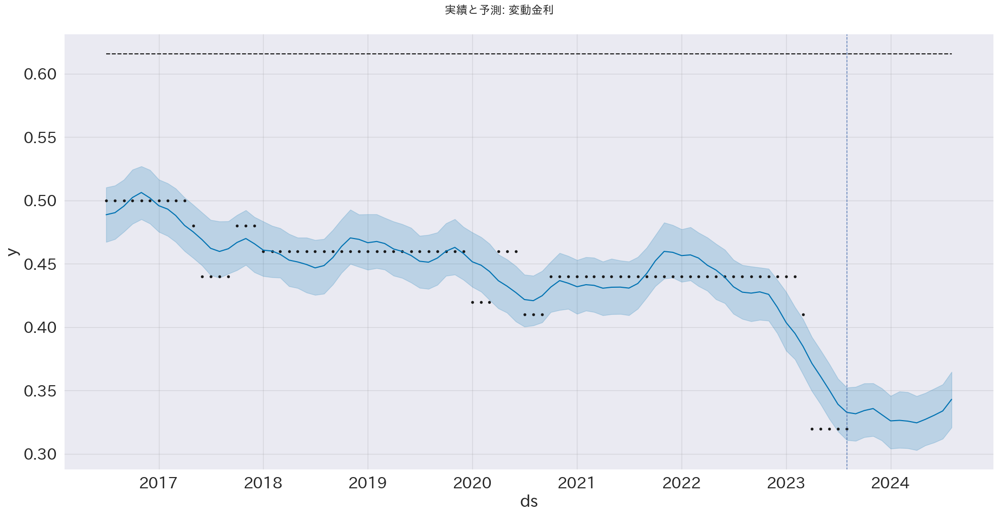

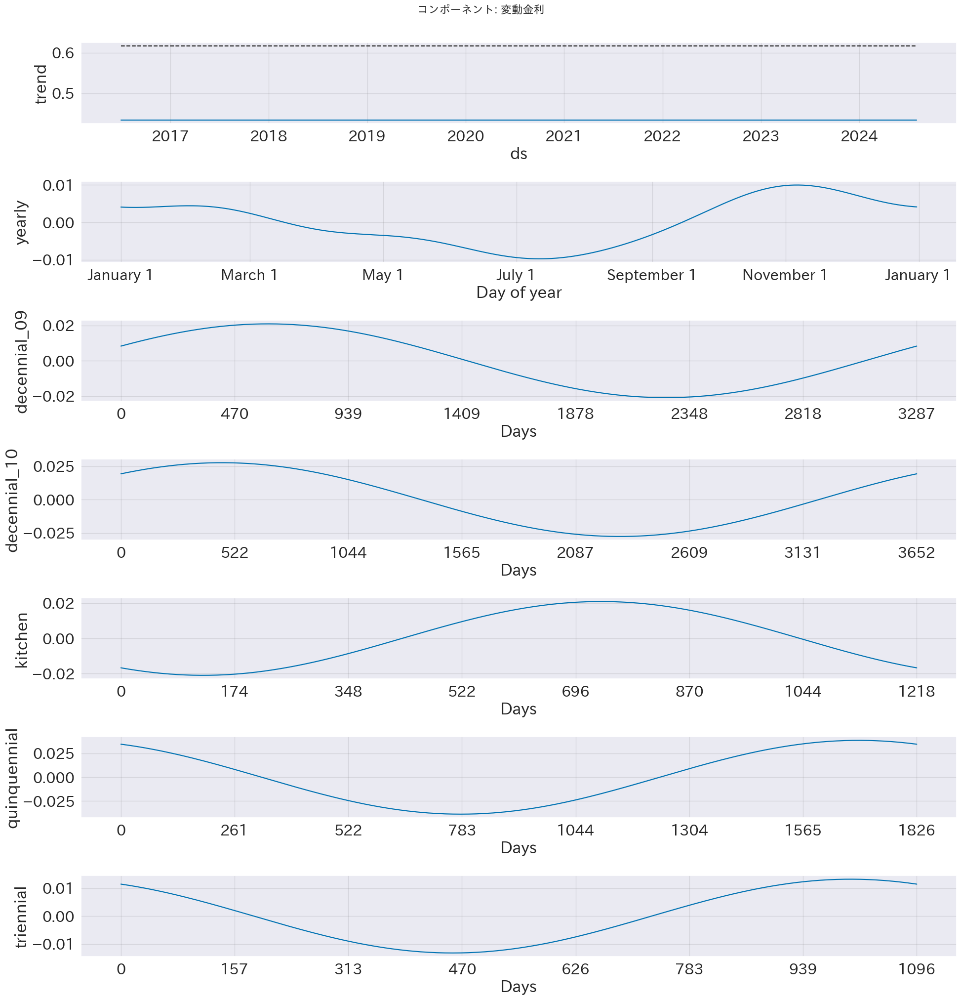

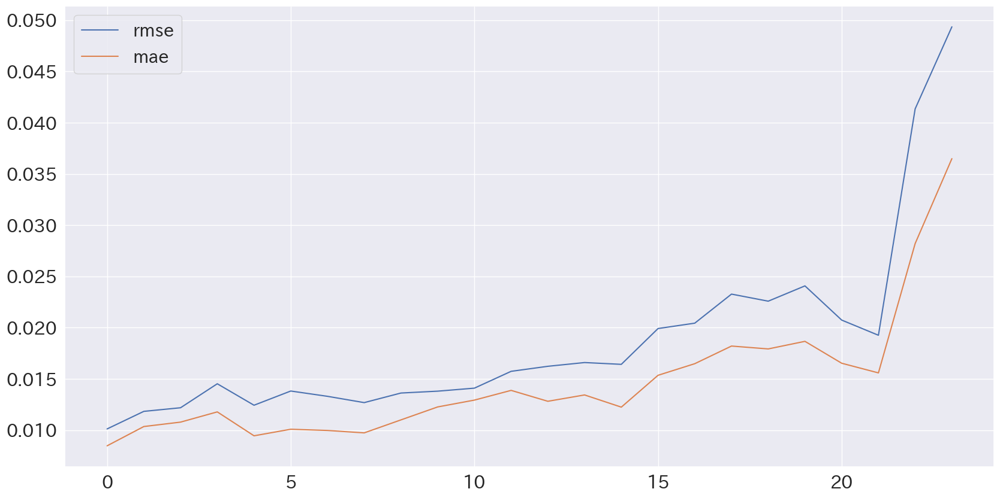

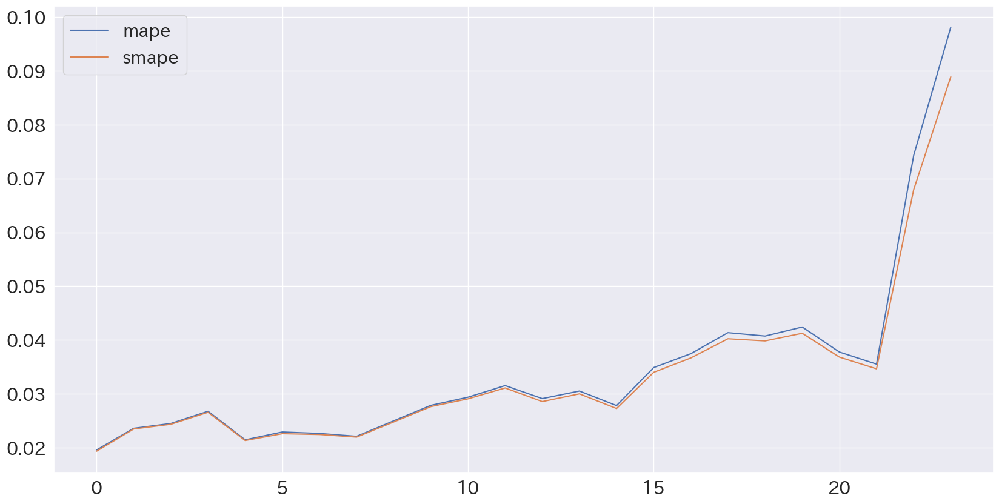

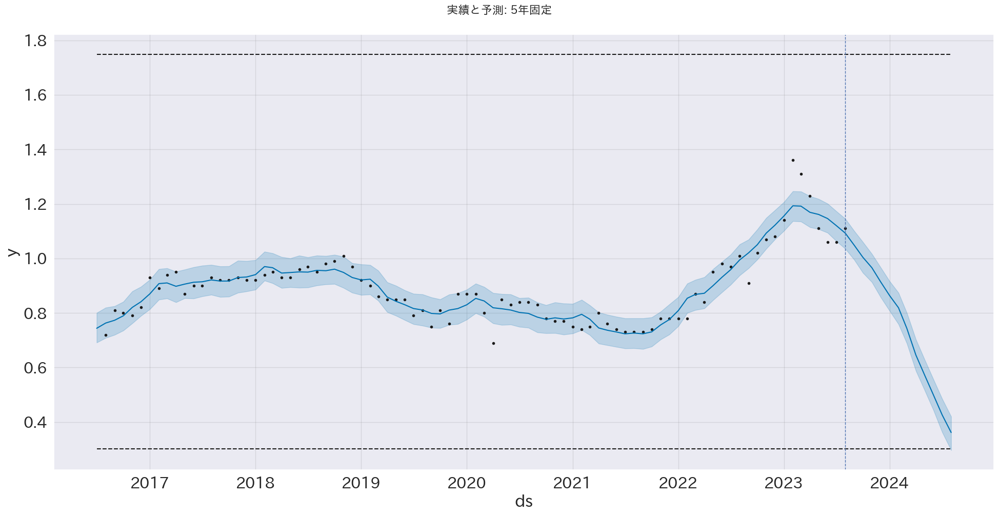

...

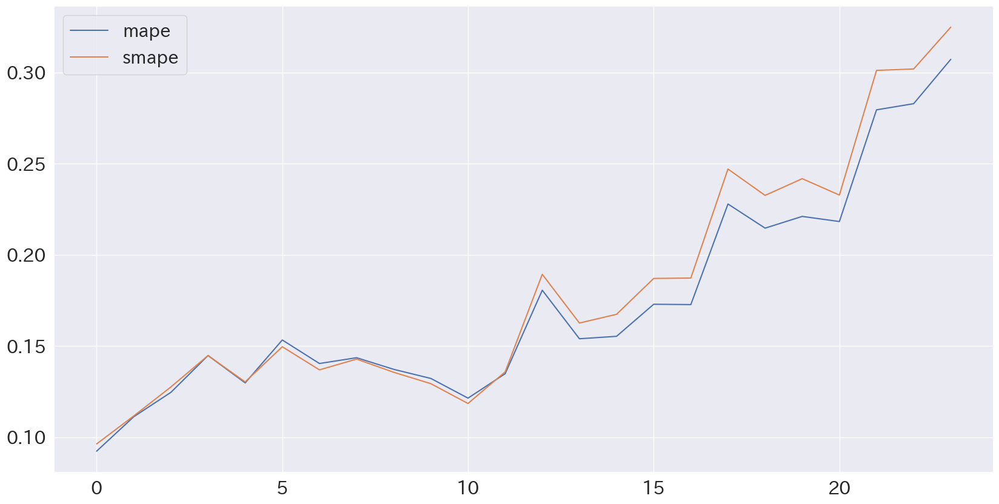

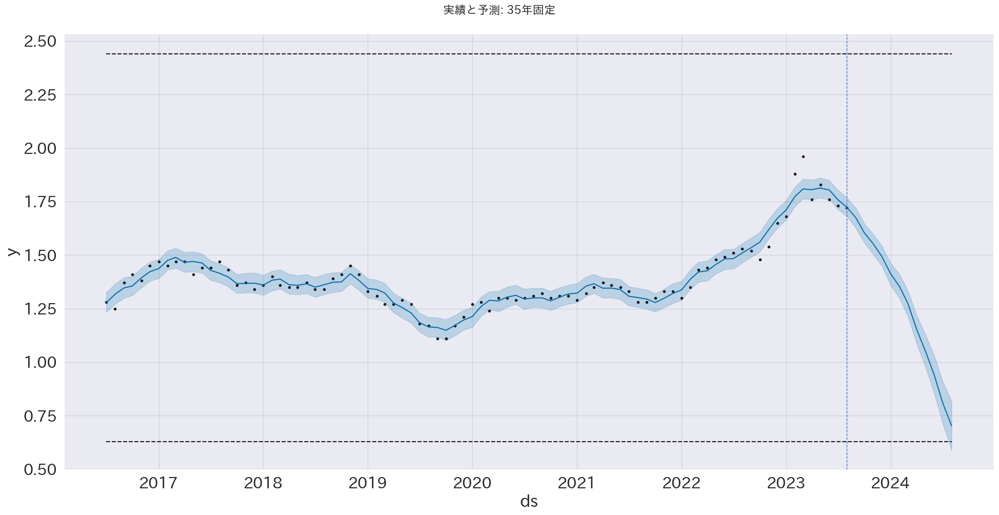

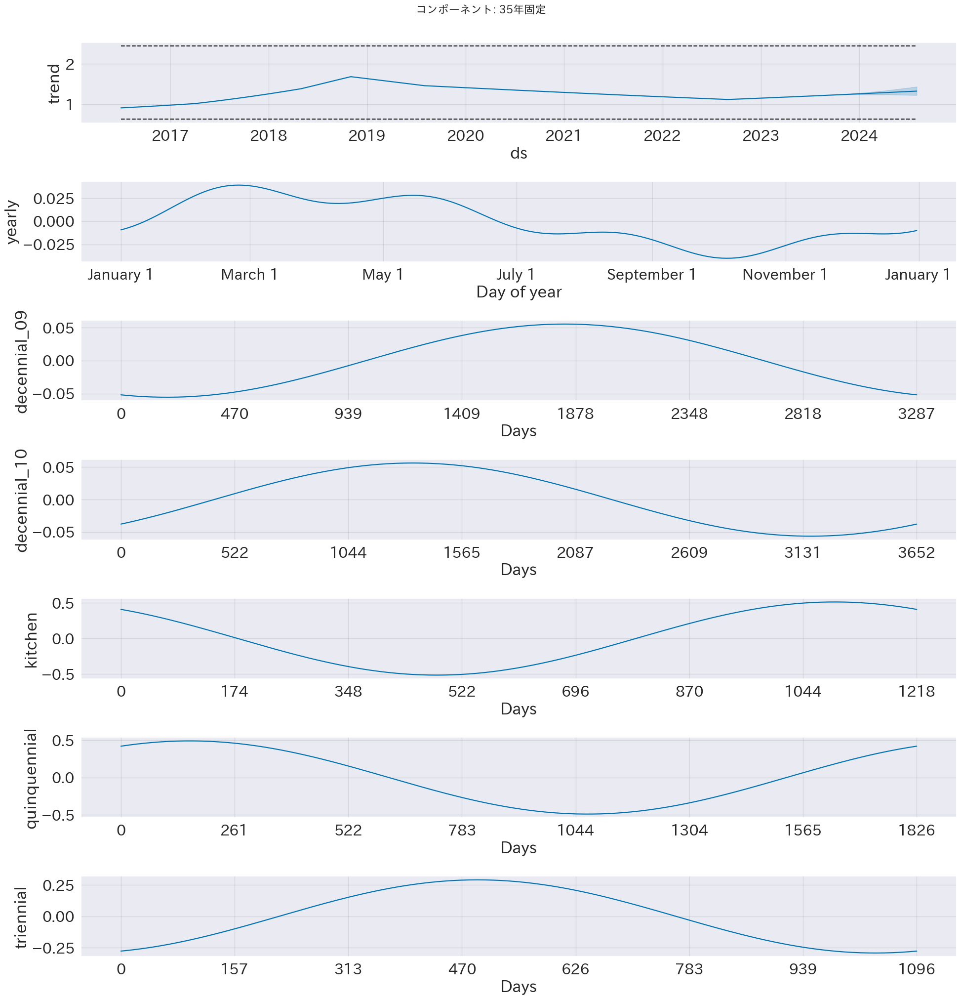

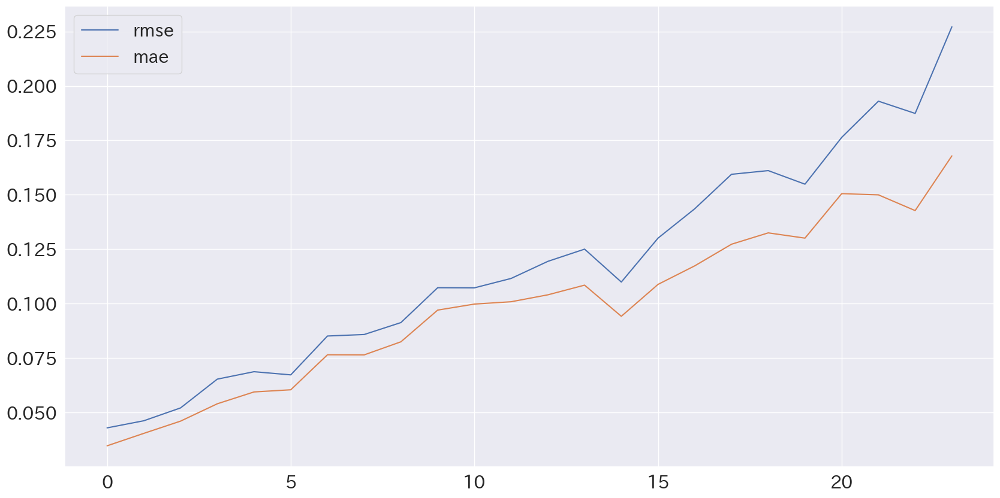

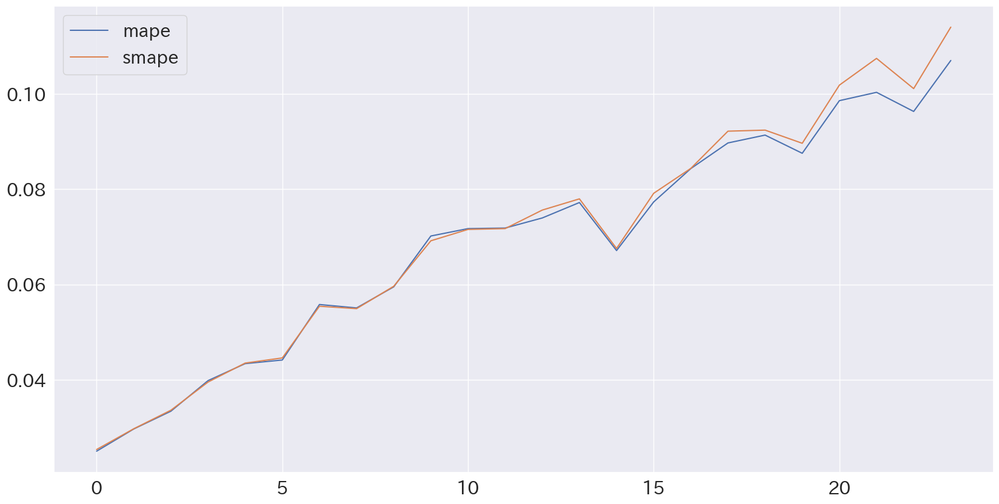

In [15]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly


n_years = 1
n_predicts = 12 * n_years
n_changepoints = len(_df) // 6
print(f"{n_changepoints=}")

best_model = {}
best_cv = {}
best_p = {}

for rate_type in ["変動金利", "5年固定", "10年固定", "35年固定"]:
    bst: BestEstimator = bests[rate_type]

    # df = _df.rename({"年月": "ds", rate_type: "y"}, axis=1)
    # print(bst.study.best_params)

    # predict
    model: Prophet = bst.model
    future = model.make_future_dataframe(periods=n_predicts, freq="MS")

    limitter = Limitter(bst.df)
    future = setup_limit(future, limitter)
    forecast = model.predict(future)

    # plot prediction
    fig1: pyplot.Figure = model.plot(forecast, figsize=(20, 10))
    fig1.suptitle(f"実績と予測: {rate_type}", x=0.5, y=1.02, size=16)
    pyplot.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=1)
    pyplot.show()

    # plot components
    fig2 = model.plot_components(forecast, figsize=(20, 20))
    fig2.suptitle(f"コンポーネント: {rate_type}", x=0.5, y=1.02, size=16)
    pyplot.show()

    # plot errors
    bst.df_pm[["rmse", "mae"]].plot()
    bst.df_pm[["mape", "smape"]].plot()
    pyplot.show()


In [16]:
# rate_type: str = "変動金利"
# rate_type: str = "5年固定"
rate_type: str = "10年固定"
# rate_type: str = "35年固定"
bst: BestEstimator = bests[rate_type]
bst.df.index = bst.df.ds
model: Prophet = bst.model

future = model.make_future_dataframe(periods=n_predicts, freq="MS")
future = setup_limit(future, Limitter(bst.df))
forecast = model.predict(future)


In [17]:
fig = optuna.visualization.plot_contour(bst.study)
fig.show()

In [18]:
fig = optuna.visualization.plot_edf(bst.study)
fig.show()

In [19]:
fig = optuna.visualization.plot_optimization_history(bst.study)
fig.show()


In [20]:
fig = optuna.visualization.plot_parallel_coordinate(bst.study)
fig.show()

In [21]:
pandas.DataFrame({k: [v] for k, v in bst.study.best_params.items()}, index=["VALUE"]).T

,VALUE
growth,linear
changepoint_range,0.849712
changepoint_prior_scale,3.488675
seasonality_prior_scale,0.042334
seasonality_mode,multiplicative


In [22]:
fig = optuna.visualization.plot_param_importances(bst.study)
fig.show()

In [23]:
fig = optuna.visualization.plot_slice(bst.study)
fig.show()


In [24]:
plot_plotly(model, forecast, trend=True, changepoints=True)

In [25]:
plot_components_plotly(model, forecast)

/home/devuser/workspace/backend/.venv/lib/python3.10/site-packages/plotly/io/_json.py:557: UserWarning:

Discarding nonzero nanoseconds in conversion.



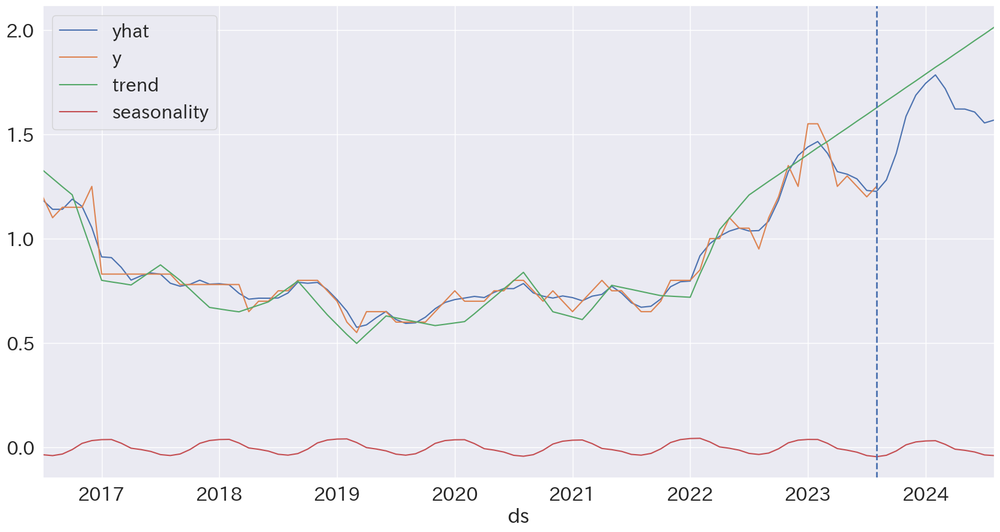

In [26]:
df_forecast = forecast.copy()
df_forecast.index = df_forecast.ds
seasonality_cols = ["yearly", "triennial", "kitchen"]

df_season = df_forecast[seasonality_cols].mean(axis=1).rename("seasonality").to_frame().set_index(df_forecast.ds)
df_season["yhat"] = df_forecast.yhat
df_season["y"] = bst.df.y
df_season["trend"] = df_forecast.trend

ax = df_season[["yhat", "y", "trend"]].plot()
ax = df_season[["seasonality"]].plot(kind="line", ax=ax)
ax.axvline(bst.df.ds.iloc[-1], color='b', linestyle='--', lw=2)
pyplot.show()

In [27]:
df_cv: pandas.DataFrame = bst.df_cv.copy()
df_cv.index = df_cv.ds
df_cv.drop("ds", axis=1, inplace=True)
df_cv.cutoff = df_cv.cutoff.astype(str)

for ctf, grp in df_cv.groupby("cutoff"):
    print(f"cutoff {ctf}: {grp.index[0]} 〜 {grp.index[-1]}")


cutoff 2020-08-01: 2020-09-01 00:00:00 〜 2021-08-01 00:00:00
cutoff 2020-11-01: 2020-12-01 00:00:00 〜 2021-11-01 00:00:00
cutoff 2021-02-01: 2021-03-01 00:00:00 〜 2022-02-01 00:00:00
cutoff 2021-05-01: 2021-06-01 00:00:00 〜 2022-05-01 00:00:00
cutoff 2021-08-01: 2021-09-01 00:00:00 〜 2022-08-01 00:00:00
cutoff 2021-11-01: 2021-12-01 00:00:00 〜 2022-11-01 00:00:00
cutoff 2022-02-01: 2022-03-01 00:00:00 〜 2023-02-01 00:00:00
cutoff 2022-05-01: 2022-06-01 00:00:00 〜 2023-05-01 00:00:00


In [28]:
base_dates = pandas.date_range(start=bst.df.ds.min(), end=df_cv.index.max(), freq="MS", name="ds")
base_dates = base_dates.to_frame().reset_index(drop=True)
base_dates.head(3)

,ds
0,2016-07-01
1,2016-08-01
2,2016-09-01


In [29]:
def setup_df_index(df: pandas.DataFrame, col="ds"):
    df.index = df[col]
    df.drop(col, axis=1, inplace=True)
    return df


In [30]:
bst.df.columns

Index(['ds', 'y', 'floor', 'cap'], dtype='object')

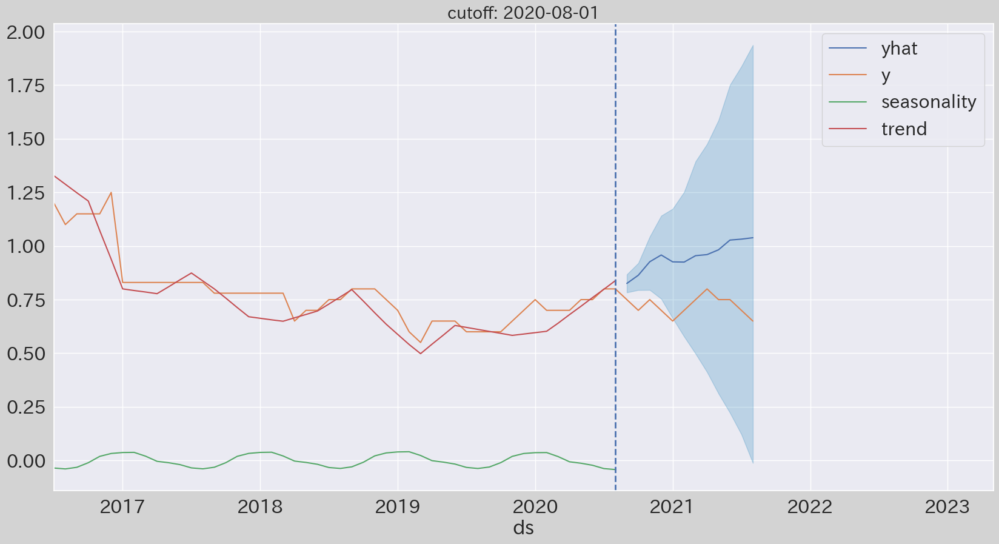

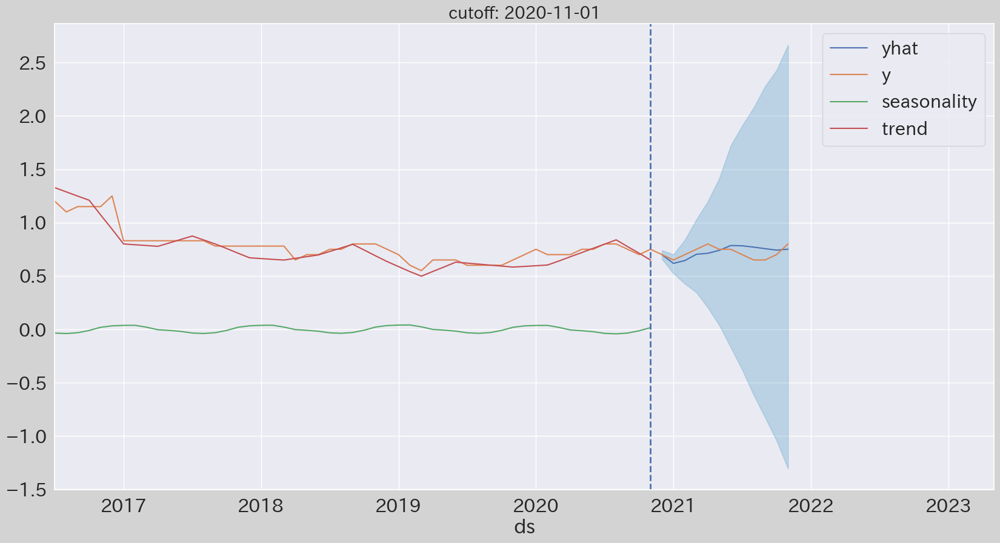

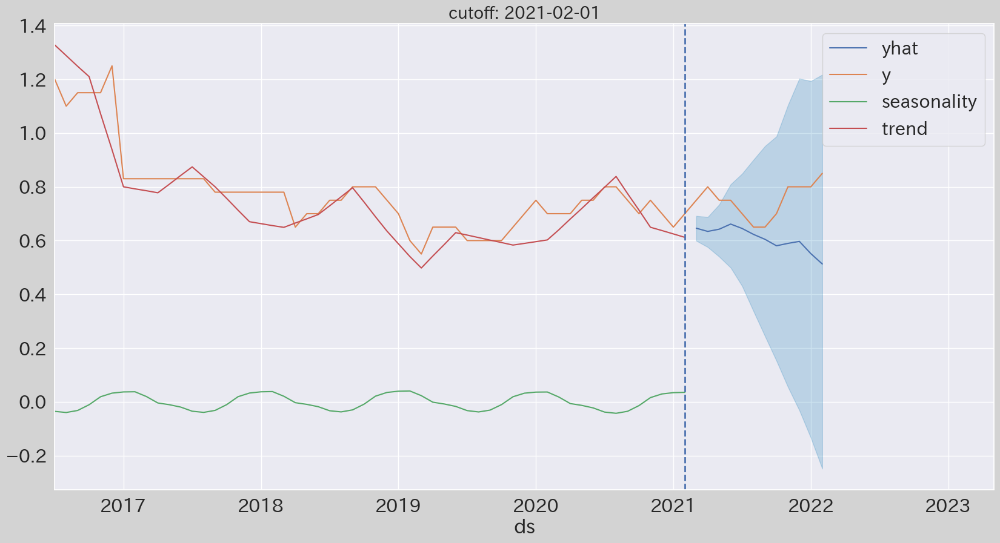

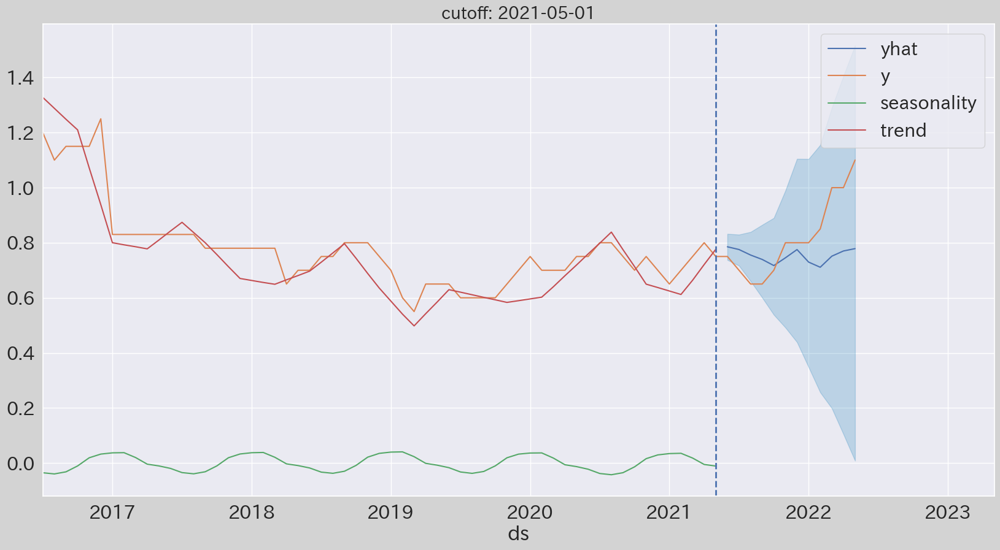

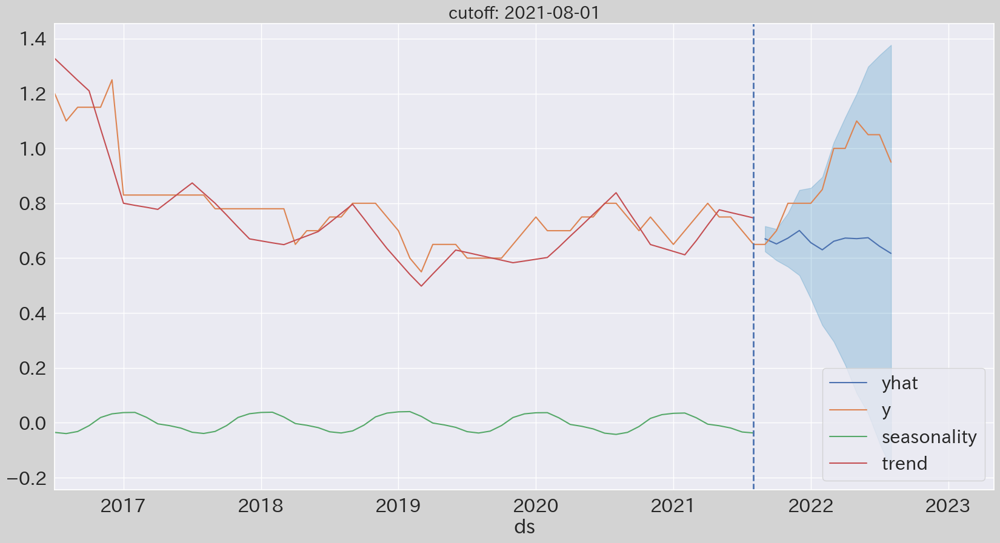

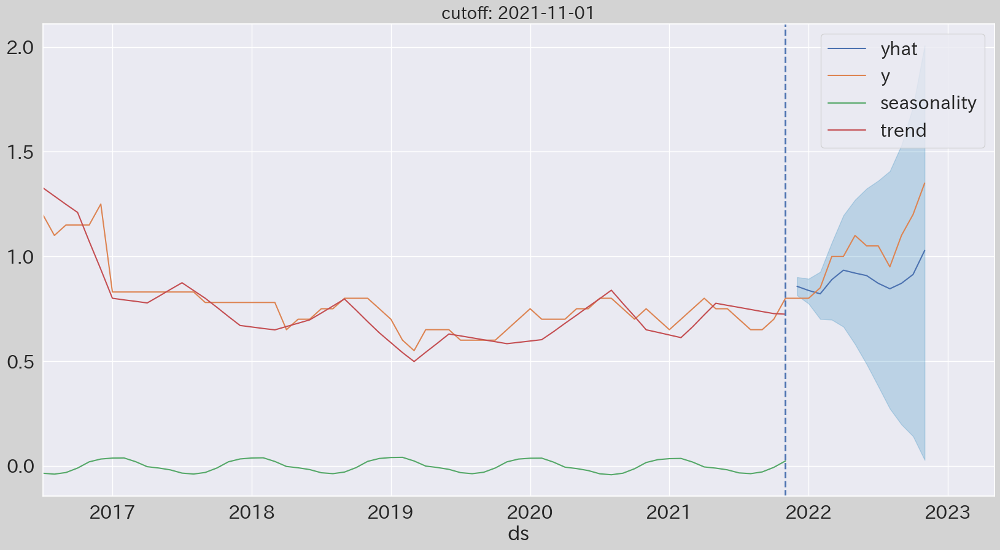

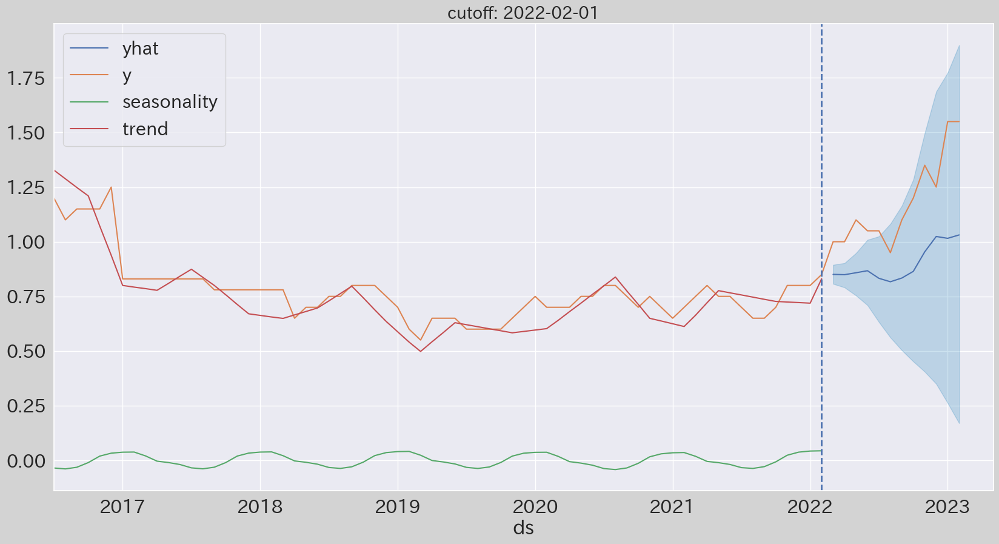

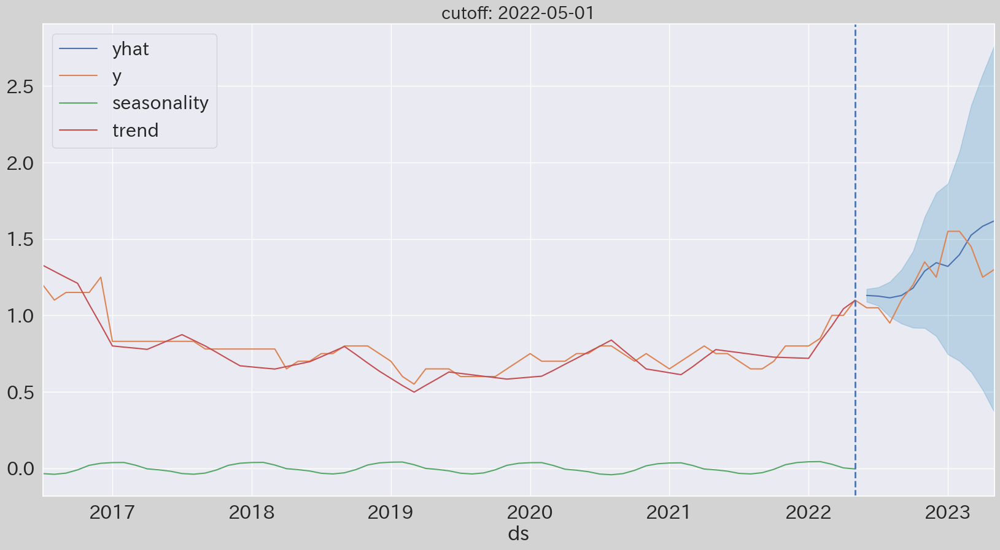

In [31]:
# import matplotlib.dates as mdates
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y/%m'))
    # ax.xaxis.set_minor_formatter(mdates.DateFormatter('%m'))
use_horizon_actual = True

for ctf, grp in df_cv.groupby("cutoff"):
    if not use_horizon_actual:
        grp.drop("y", axis=1, inplace=True)
    df_plotter = pandas.merge(base_dates, grp.reset_index(), on="ds", how="left")
    setup_df_index(df_plotter)
    df_plotter.loc[:ctf, "y"] = bst.df.y.loc[:ctf]
    df_plotter = pandas.merge(df_plotter, df_season[["seasonality", "trend"]].loc[:ctf], on="ds", how="left")
    fig = pyplot.figure(facecolor='lightgrey', figsize=(20, 10))
    ax = fig.add_subplot(111)
    df_plotter[["yhat", "y", "seasonality", "trend"]].plot(ax=ax)
    ax.fill_between(df_plotter.index, df_plotter.yhat_lower, df_plotter.yhat_upper,
                    color='#0072B2', alpha=0.2, label='Uncertainty interval')
    ax.axvline(ctf, color='b', linestyle='--', lw=2)

    pyplot.title(f"cutoff: {ctf}", fontsize=20)

    pyplot.show()

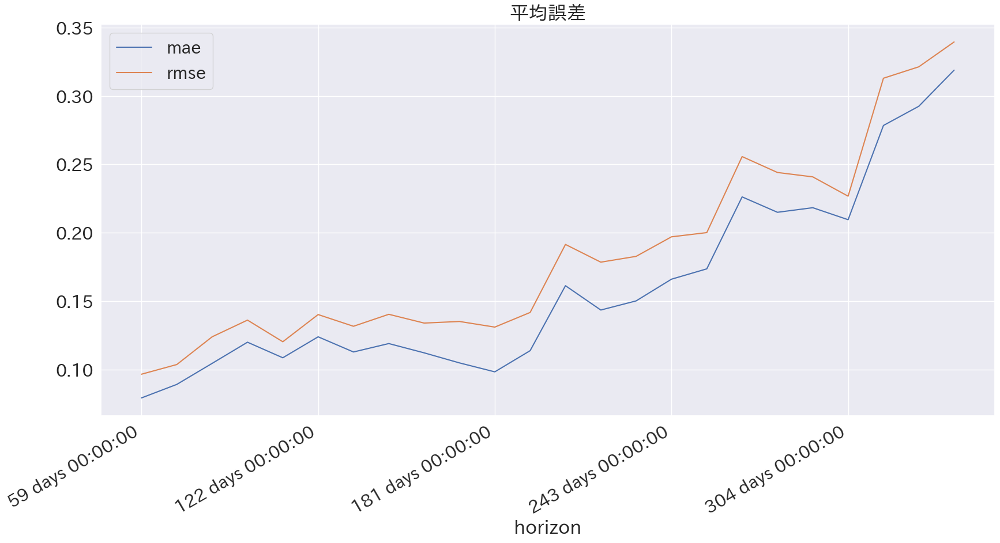

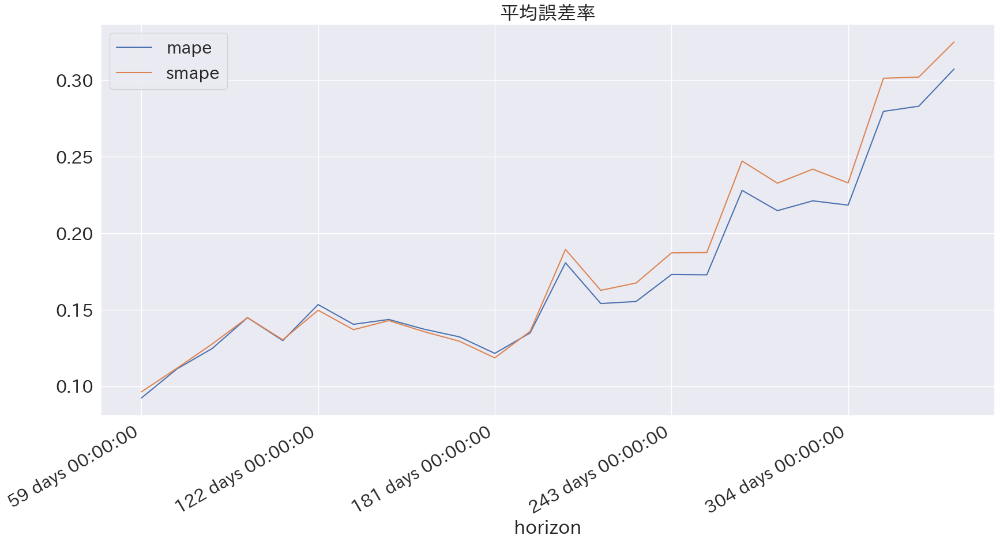

In [32]:
# fig = pyplot.figure(facecolor='lightgrey', figsize=(20, 10))
# ax = fig.add_subplot(111)

bst.df_pm.index = bst.df_pm.horizon
bst.df_pm[["mae", "rmse"]].plot(title="平均誤差")
bst.df_pm[["mape", "smape"]].plot(title="平均誤差率")
pyplot.show()